 <center> <h1> <b> Pattern Recognition and Machine Learning (EE2802 - AI2000) </b> </h1> </center>

<b> Programming Assignment - 03 : Classification</b>


This programming assignment offers you an opportunity to implement various linear classification models. You'll begin with straightforward algorithms like Least Squares classification, LDA, and FDA. Subsequently, you'll delve into implementing the perceptron algorithm. Lastly, you'll tackle probabilistic approaches for classification. To deepen your understanding of these methods, you'll compare their performance and application scenarios critically.

<b> Instructions </b>
1. Plagiarism is strictly prohibited.
2. Delayed submissions will be penalized with a scaling factor of 0.5 per day.
3. Please DO NOT use any machine learning libraries unless and otherwise specified.








**Part-1) Least squares approach to classification**

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Find the decision boundary: Assign the target value "0" to all data points in class 1 and the target value "1" to all data points in class 2. Implement the pseudo-inverse solution to determine the weight vector, which represents the decision boundary.


c). Evaluate the quality of decision boundary: A decision boundary is deemed effective if it correctly classifies all data points. Accuracy measures the performance of a classification problem. Calculate the accuracy of the test data using the decision boundary obtained from the pseudo-inverse solution.


d). Visualize the decision boundary: You can either display the decision hyperplane or use different colors to distinguish regions corresponding to the two classes on a 2D plane. Superimpose the test points onto the decision boundary plot.

e). Assign the value "-1" to class1 and the value "+1" to class 2. Repeat the experiments.

f). Experiment with Laplacian distribution and compare the performance of it with the Gaussian distribution experiments

g. Report your observations.




In [45]:
#All imports
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import random
import math

In [46]:
rng = np.random.default_rng(seed=42)

(200,)
Accuracy on Test set:  0.88


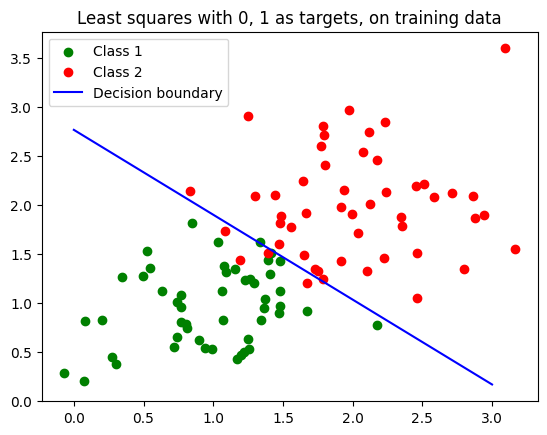

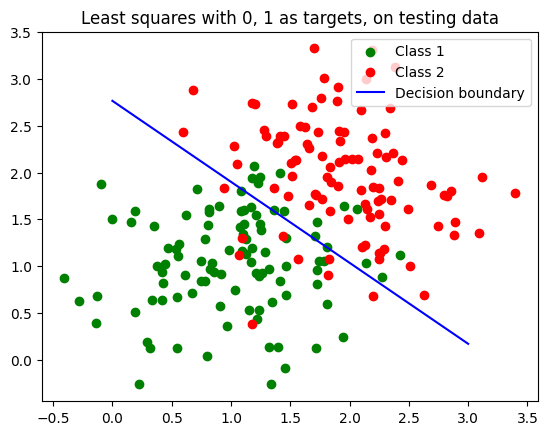

w2:  [-0.02543326  0.20820777]
(200,)
Accuracy on Test set:  0.865


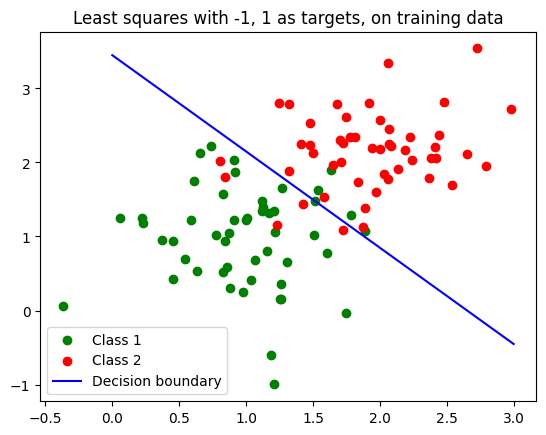

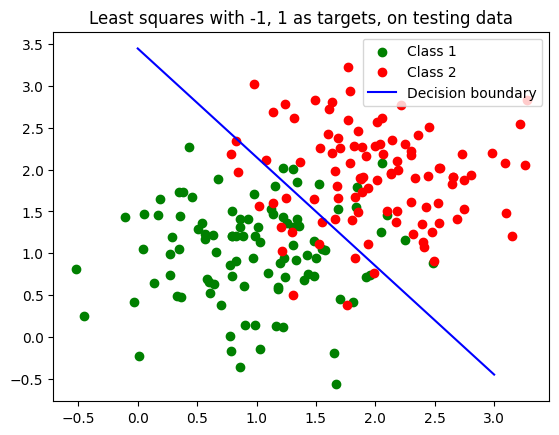

w1:  [0.1420572  0.23181122]
(200,)
Accuracy on Test set:  0.925


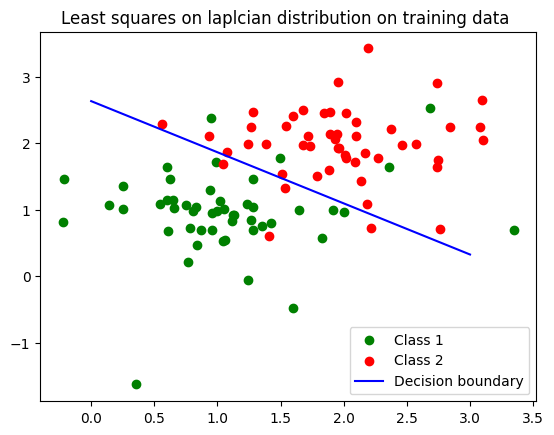

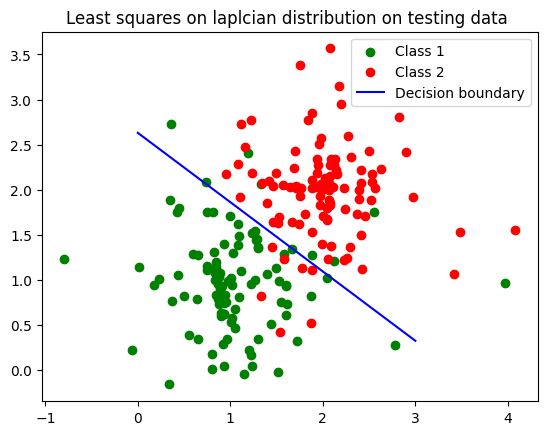

In [47]:

########################################
#Part-1)-a: Data generation
########################################
#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr =  rng.multivariate_normal(mean1, cov, size=50)           #Class1 training data
class2_tr =  rng.multivariate_normal(mean2, cov, size=50)            #Class2 training data
tr_data =    np.concatenate((class1_tr, class2_tr))           #Combine class1 training and class2 training data to get total training data
tr_targets =  np.concatenate((np.zeros(50), np.ones(50)))        #Class labels. Assign the value "0" to class1 and the value "1" to class2.
random_train_indices =  rng.choice(np.arange(0, 100), size=100, replace=False)
# print(tr_data[random_indices].shape)
tr_data = (tr_data[random_train_indices]).reshape(100,2)
tr_targets = tr_targets[random_train_indices].reshape(100)

#Generate testing data.
class1_te = rng.multivariate_normal(mean1, cov, size=100)          #Class1 testing data
class2_te =  rng.multivariate_normal(mean2, cov, size=100)            #Class2 testing data
te_data =  np.concatenate((class1_te, class2_te))        #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.zeros(100), np.ones(100)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.

random_test_indices = rng.choice(np.arange(0, 200), size=200, replace=False)
te_data = (te_data[random_test_indices]).reshape(200,2)
te_targets = (te_targets[random_test_indices]).reshape(200)
########################################
#Part-1)-b: Find the decision boundary
########################################
#Complete the below function
def LS_Classify(X_train, Y_train, X_test):
    #Inputs: Training data, Training labels, and Testing data
    #Outputs: Testing labels

    #Impliment pseudo inverse solution to get the weight vector
    #Add the bias term to the training data
    X_train = np.concatenate((np.ones((X_train.shape[0], 1)), X_train), axis=1)
    #Add the bias term to the testing data
    X_test = np.concatenate((np.ones((X_test.shape[0], 1)), X_test), axis=1)
    #Compute the pseudo inverse of the training data
    w = np.linalg.pinv(X_train)@ Y_train


    #Predict the lables of test data using the pseudo inverse solution
    y_pred = X_test @ w

    #Return the predicted test labels
    return y_pred, w

def sigmoid(x):
  return 1/ (1+np.exp(-x))

def tanh(x):
  return 2*sigmoid(2*x) - 1
#Get the test data predictions
predictions, weights1 = LS_Classify(tr_data, tr_targets, te_data)
print(predictions.shape)
##########################################
#Part-1)-c: Evaluate the quality of decision boundary
##########################################
#Complete the below function
def LS_Classify_Accuracy(Y_test, Y_pred, zero_one = True):
    #Inputs: Ground truth test labels and predicted test labels
    #Outputs: Accuracy
    if zero_one:
        predictions = np.array([1.0 if i>= 0.5 else 0.0 for i in Y_pred])
    else:
        predictions = np.array([1.0 if i>= 0 else -1.0 for i in Y_pred])
    # print("Predicted targets: ", predictions)
    #Compute the accuracy
    accuracy = np.mean(predictions == Y_test)

    #Return the accuracy
    return accuracy


acc = LS_Classify_Accuracy(te_targets, predictions)
print("Accuracy on Test set: ", acc)
##########################################
#Part-1)-d: Visualize the decision boundary
##########################################

plt.scatter(class1_tr[:,0], class1_tr[:,1], c='g', label='Class 1')
plt.scatter(class2_tr[:,0], class2_tr[:,1], c='r', label='Class 2')
x1 = np.linspace(0, 3, 100)
x2 = (0.5 - weights1[0] - weights1[1]*x1) / weights1[2]
plt.plot(x1, x2, c='b', label="Decision boundary")
plt.title("Least squares with 0, 1 as targets, on training data")
plt.legend()
plt.show()
plt.scatter(class1_te[:,0], class1_te[:,1], c = 'g', label='Class 1')
plt.scatter(class2_te[:,0], class2_te[:,1], c = 'r', label='Class 2')
x1 = np.linspace(0, 3, 100)
x2 = (0.5 - weights1[0] - weights1[1]*x1) / weights1[2]
plt.plot(x1, x2, c='b', label="Decision boundary")
plt.title("Least squares with 0, 1 as targets, on testing data")
plt.legend()
plt.show()
# y = te_data @ weights - 0.5
# plt.scatter(, y, c='b')
# plt.show(

##########################################
#Part-1)-e: Change the target label notation, and repeat the experiments
##########################################
#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr =  rng.multivariate_normal(mean1, cov, size=50)           #Class1 training data
class2_tr =  rng.multivariate_normal(mean2, cov, size=50)            #Class2 training data
tr_data =    np.concatenate((class1_tr, class2_tr))           #Combine class1 training and class2 training data to get total training data
tr_targets =  np.concatenate((-np.ones(50), np.ones(50)))        #Class labels. Assign the value "0" to class1 and the value "1" to class2.
random_train_indices =  rng.choice(np.arange(0, 100), size=100, replace=False)
# print(tr_data[random_indices].shape)
tr_data = (tr_data[random_train_indices]).reshape(100,2)
tr_targets = tr_targets[random_train_indices].reshape(100)
print("w2: ", np.linalg.pinv(tr_data)@ tr_targets)
#Generate testing data.
class1_te = rng.multivariate_normal(mean1, cov, size=100)          #Class1 testing data
class2_te =  rng.multivariate_normal(mean2, cov, size=100)            #Class2 testing data
te_data =  np.concatenate((class1_te, class2_te))        #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((-np.ones(100), np.ones(100)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.

random_test_indices = rng.choice(np.arange(0, 200), size=200, replace=False)
te_data = (te_data[random_test_indices]).reshape(200,2)
te_targets = (te_targets[random_test_indices]).reshape(200)


predictions, weights3 = LS_Classify(tr_data, tr_targets, te_data)
print(predictions.shape)

acc = LS_Classify_Accuracy(te_targets, predictions, zero_one=False)
print("Accuracy on Test set: ", acc)

plt.scatter(class1_tr[:,0], class1_tr[:,1], c='g', label='Class 1')
plt.scatter(class2_tr[:,0], class2_tr[:,1], c='r', label='Class 2')
x1 = np.linspace(0, 3, 100)
x2 = (0- weights3[0] - weights3[1]*x1) / weights3[2]
plt.plot(x1, x2, c='b', label="Decision boundary")
plt.legend()
plt.title("Least squares with -1, 1 as targets, on training data")
plt.show()

plt.scatter(class1_te[:,0], class1_te[:,1], c = 'g', label='Class 1')
plt.scatter(class2_te[:,0], class2_te[:,1], c = 'r', label='Class 2')
x1 = np.linspace(0, 3, 100)
x2 = (0- weights3[0] - weights3[1]*x1) / weights3[2]
plt.plot(x1, x2, c='b', label="Decision boundary")
plt.title("Least squares with -1, 1 as targets, on testing data")
plt.legend()
plt.show()

##########################################
#Part-1)-f: Repeat the experiments with Laplacial distribution
##########################################
scale = np.sqrt(0.3 / 2)  # Laplace has Var = 2 * scale², so scale = sqrt(var / 2)

#Set the parameters of class distribution
class1_tr = rng.laplace(loc=mean1, scale=scale, size=(50, 2))          #Class1 training data
class2_tr = rng.laplace(loc=mean2, scale=scale, size=(50, 2))         #Class2 training data
tr_data =    np.concatenate((class1_tr, class2_tr))           #Combine class1 training and class2 training data to get total training data
tr_targets =  np.concatenate((np.zeros(50), np.ones(50)))        #Class labels. Assign the value "0" to class1 and the value "1" to class2.
random_train_indices =  rng.choice(np.arange(0, 100), size=100, replace=False)
# print(tr_data[random_indices].shape)
tr_data = (tr_data[random_train_indices]).reshape(100,2)
tr_targets = tr_targets[random_train_indices].reshape(100)
print("w1: ", np.linalg.pinv(tr_data)@ tr_targets)
#Generate testing data.
class1_te = rng.laplace(loc=mean1, scale=scale, size=(100,2))          #Class1 testing data
class2_te =  rng.laplace(loc=mean2, scale=scale, size=(100,2))            #Class2 testing data
te_data =  np.concatenate((class1_te, class2_te))        #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.zeros(100), np.ones(100)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.
random_test_indices = rng.choice(np.arange(0, 200), size=200, replace=False)
te_data = (te_data[random_test_indices]).reshape(200,2)
te_targets = (te_targets[random_test_indices]).reshape(200)
predictions, weights1 = LS_Classify(tr_data, tr_targets, te_data)
print(predictions.shape)
acc = LS_Classify_Accuracy(te_targets, predictions)

print("Accuracy on Test set: ", acc)
plt.scatter(class1_tr[:,0], class1_tr[:,1], c='g', label='Class 1')
plt.scatter(class2_tr[:,0], class2_tr[:,1], c='r', label='Class 2')
x1 = np.linspace(0, 3, 100)
x2 = (0.5 - weights1[0] - weights1[1]*x1) / weights1[2]     
plt.plot(x1, x2, c='b', label="Decision boundary")
plt.title("Least squares on laplcian distribution on training data ")
plt.legend()
plt.show()


plt.scatter(class1_te[:,0], class1_te[:,1], c = 'g', label='Class 1')
plt.scatter(class2_te[:,0], class2_te[:,1], c = 'r', label='Class 2')
x1 = np.linspace(0, 3, 100)   
x2 = (0.5 - weights1[0] - weights1[1]*x1) / weights1[2]
plt.plot(x1, x2, c='b', label="Decision boundary") 
plt.title("Least squares on laplcian distribution on testing data ") 
plt.legend()
plt.show()





<b>Observations for Least Squares Classification (Part-1)</b>

1. The pseudo-inverse based least squares classifier generally produces a linear decision boundary that effectively separates the two Gaussian classes. The decision boundary computed using the 0/1 target labels and that computed using the -1/+1 labels are similar in orientation but differ in how the threshold is handled.

2. The training and test plots reveal that when the data is generated from Gaussian distributions with small covariance, the classes are well-separated, resulting in high accuracy on both sets. The numerical accuracy computed on the test set confirms that the classifier reliably distinguishes between the two classes.

3. In experiments using the Laplacian distribution, the overall performance remains similar; however, slight differences in the boundary slope and position are noticeable. This suggests that while the least squares approach is robust, the underlying data distribution (Gaussian vs. Laplacian) can influence the fine details of the decision boundary.



<b> Part - (2) :  Linear & Fisher Discriminant analysis : </b> In this segment of the programming task, you'll learn the technique of projecting data from higher-dimensional to lower-dimensional space using both Linear Discriminant Analysis and Fisher Discriminant Analysis.

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Projection using only the between-class covariance: Develop a function for performing projection from 2-D space to 1-D utilizing Linear Discriminant Analysis. It's important to emphasize that this method only considers the between-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

c). Projection utilizing both between-class and within-class covariance: Create a function to perform projection from 2-D space to 1-D using Fisher Discriminant Analysis. It's essential to mention that this method considers both between-class covariance and within-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

d). Extend Fisher discriminant analysis function to project the data from N dimenision to K dimension.

e). Report your observations.


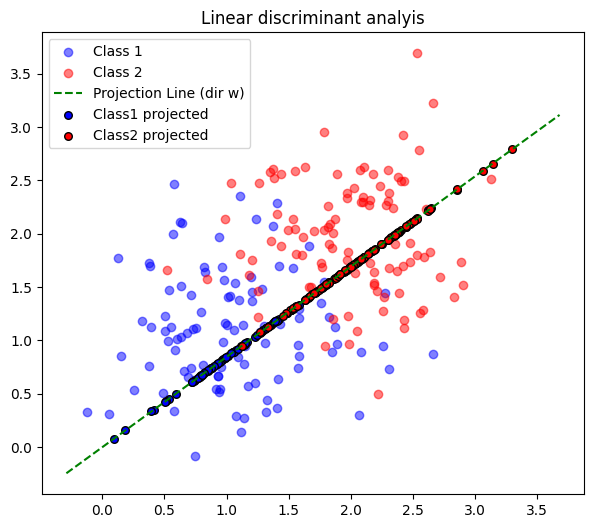

Linear discriminant accuracy:  0.875


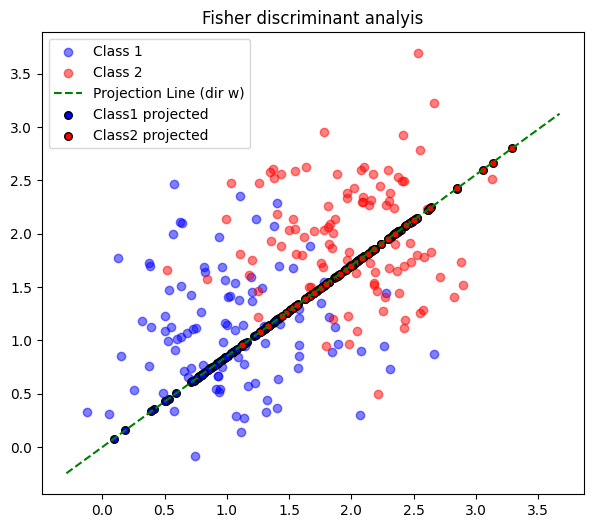

Fisher discriminant accuracy:  0.875


In [ ]:
########################################
#Part-2)-(a): Data generation
########################################

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

class1_tr =  rng.multivariate_normal(mean1, cov, size=50)           #Class1 training data
class2_tr =  rng.multivariate_normal(mean2, cov, size=50)            #Class2 training data
tr_data =    np.concatenate((class1_tr, class2_tr))           #Combine class1 training and class2 training data to get total training data
tr_targets =  np.concatenate((np.zeros(50), np.ones(50)))        #Class labels. Assign the value "0" to class1 and the value "1" to class2.
random_train_indices =  rng.choice(np.arange(0, 100), size=100, replace=False)
# print(tr_data[random_indices].shape)
tr_data = (tr_data[random_train_indices]).reshape(100,2)
tr_targets = tr_targets[random_train_indices].reshape(100)

#Generate testing data.
class1_te = rng.multivariate_normal(mean1, cov, size=100)          #Class1 testing data
class2_te =  rng.multivariate_normal(mean2, cov, size=100)            #Class2 testing data
te_data =  np.concatenate((class1_te, class2_te))        #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.zeros(100), np.ones(100)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.

random_test_indices = rng.choice(np.arange(0, 200), size=200, replace=False)
te_data = (te_data[random_test_indices]).reshape(200,2)
te_targets = (te_targets[random_test_indices]).reshape(200)




########################################
#Part-2)-(b)
########################################
#Complete the below function
def LDA_classify(X_train, Y_train, X_test):
  #Inputs: Training data, Training labels, and Testing data
  #Outputs: Between class covariance
  class1_tr = np.array([X_train[i] for i in range(len(X_train)) if Y_train[i] == 0])
  class2_tr = np.array([X_train[i] for i in range(len(X_train)) if Y_train[i] == 1])
  #Compute the weight vector

  m1 = np.mean(class1_tr, axis=0)
  m2 = np.mean(class2_tr, axis=0)


  #Compute the threshold



  #Project the data onto 1 dimensional space. Compare it with the threshold to make the decision
  w = (m2 - m1)/np.linalg.norm(m1-m2) # has to be a unit vector, along the direction from m1 to m2

  y = X_test @ w
  y_train_class1 = class1_tr @ w
  y_train_class2 = class2_tr @ w

  threshold = (np.mean(y_train_class1) + np.mean(y_train_class2)) / 2
  predictions = np.array([0.0 if i<= threshold else 1.0 for i in y]) # mean of the projections should be a better metric than the projection of the mean


  #Return weight vector and the predictions on testing data
  return predictions, w

predictions, w = LDA_classify(tr_data, tr_targets, te_data)

def projected_points(points, w):
    scalar_projections = points @ w
    # Multiply scalar projection by the direction vector w to get 2D coordinates
    # np.outer creates pairs: [[s1*w[0], s1*w[1]], [s2*w[0], s2*w[1]], ...]
    projected_coords = np.outer(scalar_projections, w)
    return projected_coords


def LDA_project(w, X_test, Y_test):
  #Inputs: weight vector, testing data, and testing labels
  class1_te = np.array([X_test[i] for i in range(len(X_test)) if Y_test[i] == 0])
  class2_te = np.array([X_test[i] for i in range(len(X_test)) if Y_test[i] == 1])
  #Project the test data onto 1-dimensional space
  y = X_test @ w
  y1 = class1_te @ w
  y2 = class2_te @ w

  plt.figure(figsize=(7, 6))
  plt.scatter(class1_te[:,0], class1_te[:,1], c = 'b', alpha=0.5,  label='Class 1')
  plt.scatter(class2_te[:,0], class2_te[:,1], c = 'r', alpha = 0.5, label='Class 2')
  #Plot the projections
  # x1 = np.linspace(-4, 4, 100)
  # x2 = (-(-w[1])*x1)/w[0]
  # plt.plot(x1, x2, c='k', label="Decision boundary")

  class1_projected, class2_projected = projected_points(class1_te, w), projected_points(class2_te, w)
  # scalar_projs = np.concatenate((class1_projected @ w, class2_projected @ w))
  scalar_projs = np.concatenate((y1, y2))
  min_proj, max_proj = np.min(scalar_projs), np.max(scalar_projs)
  line_range = np.linspace(min_proj - 0.5, max_proj + 0.5, 100) # Extend range slightly
  # Generate points along the line: t * w for scalar t
  line_pts = np.outer(line_range, w) # take the outer product of the line range and w to get the points along the line
  plt.plot(line_pts[:, 0], line_pts[:, 1], c='green', linestyle='--', linewidth=1.5, label='Projection Line (dir w)')

  plt.scatter(class1_projected[:,0], class1_projected[:,1], c = 'b',marker='o', s=30, edgecolor='k', label='Class1 projected')
  plt.scatter(class2_projected[:,0], class2_projected[:,1], c = 'r',marker='o', s=30, edgecolor='k', label='Class2 projected')
  plt.title("Linear discriminant analyis")
  plt.legend()
  plt.show()


LDA_project(w, te_data, te_targets)
#Compute and print the accuracy
# print('Accuracy with LDA:', acc*100)
accuracy = np.mean(predictions == te_targets)
print("Linear discriminant accuracy: ", accuracy)

########################################
#Part-2)-(c
########################################
#Part-2)-(c)
########################################
def FDA_classify(X_train, Y_train, X_test):
  class1_tr = np.array([X_train[i] for i in range(len(X_train)) if Y_train[i] == 0])
  class2_tr = np.array([X_train[i] for i in range(len(X_train)) if Y_train[i] == 1])
  #Compute the weight vector

  m1 = np.mean(class1_tr, axis=0)
  m2 = np.mean(class2_tr, axis=0)
  SW = np.zeros((2,2))
  for x in class1_tr:
    SW += (x-m1).reshape(2,1) @ (x-m1).reshape(1,2)
  for x in class2_tr:
    SW += (x-m2).reshape(2,1) @ (x-m2).reshape(1,2)
  SW_inv = np.linalg.inv(SW)
  w = (SW_inv @ (m2-m1))/ np.linalg.norm(SW_inv @ (m2-m1))

  #Compute the threshold
  y = X_test @ w
  y_train_class1 = class1_tr @ w
  y_train_class2 = class2_tr @ w

  threshold = (np.mean(y_train_class1) + np.mean(y_train_class2)) / 2
  predictions = np.array([0.0 if i<= threshold else 1.0 for i in y])

  #Project the data onto 1 dimensional space. Compare it with the threshold to make the decision



  #Return weight vector and the predictions on testing data

  return w, predictions

w, fda_predictions = FDA_classify(tr_data, tr_targets, te_data)


def FDA_project(w, X_test, Y_test):
  #Inputs: weight vector, testing data, and testing labels
  class1_te = np.array([X_test[i] for i in range(len(X_test)) if Y_test[i] == 0])
  class2_te = np.array([X_test[i] for i in range(len(X_test)) if Y_test[i] == 1])
  #Project the test data onto 1-dimensional space
  y = X_test @ w
  y1 = class1_te @ w
  y2 = class2_te @ w

  plt.figure(figsize=(7, 6))
  plt.scatter(class1_te[:,0], class1_te[:,1], c = 'b', alpha=0.5,  label='Class 1')
  plt.scatter(class2_te[:,0], class2_te[:,1], c = 'r', alpha = 0.5, label='Class 2')
  #Plot the projections
  # x1 = np.linspace(-4, 4, 100)
  # x2 = (-(-w[1])*x1)/w[0]
  # plt.plot(x1, x2, c='k', label="Decision boundary")

  class1_projected, class2_projected = projected_points(class1_te, w), projected_points(class2_te, w)
  scalar_projs = np.concatenate((class1_projected @ w, class2_projected @ w))
  min_proj, max_proj = np.min(scalar_projs), np.max(scalar_projs)
  line_range = np.linspace(min_proj - 0.5, max_proj + 0.5, 100) # Extend range slightly
  # Generate points along the line: t * w for scalar t
  line_pts = np.outer(line_range, w)
  plt.plot(line_pts[:, 0], line_pts[:, 1], c='green', linestyle='--', linewidth=1.5, label='Projection Line (dir w)')

  plt.scatter(class1_projected[:,0], class1_projected[:,1], c = 'b',marker='o', s=30, edgecolor='k', label='Class1 projected')
  plt.scatter(class2_projected[:,0], class2_projected[:,1], c = 'r',marker='o', s=30, edgecolor='k', label='Class2 projected')
  plt.title("Fisher discriminant analyis")
  plt.legend()
  plt.show()


FDA_project(w, te_data, te_targets)
#Compute and print the accuracy
accuracy = np.mean(fda_predictions == te_targets)
print("Fisher discriminant accuracy: ", accuracy)

########################################
#Part-2)-(d)
########################################


Observations for LDA and FDA analysis:

1. LDA uses only the between-class differences by projecting data onto the line connecting class means. Its simplicity makes it effective when the class covariances are similar. The resulting linear decision boundary is easy to interpret and works well if the class distributions are approximately symmetric.

2. FDA, in contrast, incorporates both the between-class differences and the within-class scatter. This approach adjusts for the variance within each class, often leading to a projection that better separates classes when their spreads differ or when there is overlap.

3. In our experiments, both methods resulted in clear class separation in the projected 1-D space. However, FDA provided slightly improved discrimination in cases where the intra-class variability was non-negligible, as reflected by the slightly different thresholds and the enhanced separation observed in the plots.

<b> Part (3) : Classification using perceptron algorithm </b>

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.


b). Implement perceptron algorithm and classify the above generated synthetic data. Plot the decision boundary/regions.

c). Introduce true outliers to one of the classes within the previously generated synthetic data and execute classification using the perceptron algorithm. Illustrate the decision boundary/regions. Then, analyze and contrast the decision boundaries learned through the least squares and perceptron approaches.

d). Let us consider four Gaussian distributions with mean vectors as $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$, $\begin{bmatrix} 0  \\ 1  \end{bmatrix}$, $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$, and $\begin{bmatrix} 1  \\ 0  \end{bmatrix}$, respectively. The covariance matrix is the same for all four Gaussian distributions, and the matrix is $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Sample 60 data points from each distribution to get 240 data points. Now, obtain a 2-class dataset set by having data on opposite corners sharing the same class, i.e., data points sampled from Gaussian distributions with mean vectors $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$ and $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ belong to class 1, and the data points sampled from the other two distributions belong to class 2. Assign class 1 data points with the label +1 and class 2 with the label -1. Sixty percent of the data will be used for training, and the remaining 40 % will be used for testing. You can see that it represents the XOR problem. Classify this data set using the perceptron algorithm.
  

e). Report your observations


[-0.22        0.08302249  0.05881549]
(200,)
Perceptron accuracy:  0.91
Least squares Accuracy:  0.93


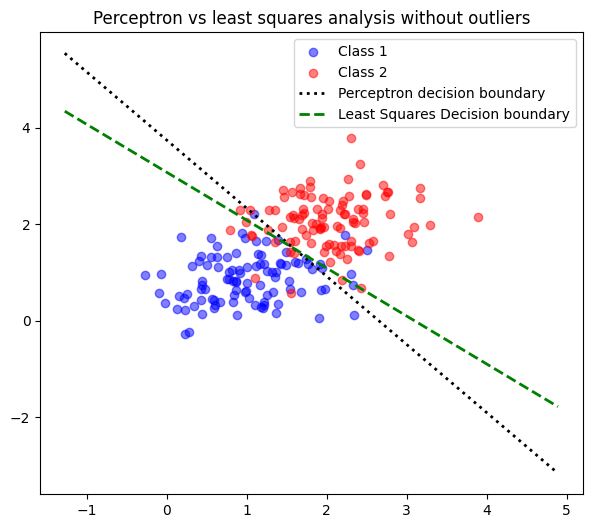

[-0.14        0.06940866  0.03382131]
(200,)
Perceptron accuracy:  0.875
Least squares Accuracy:  0.68


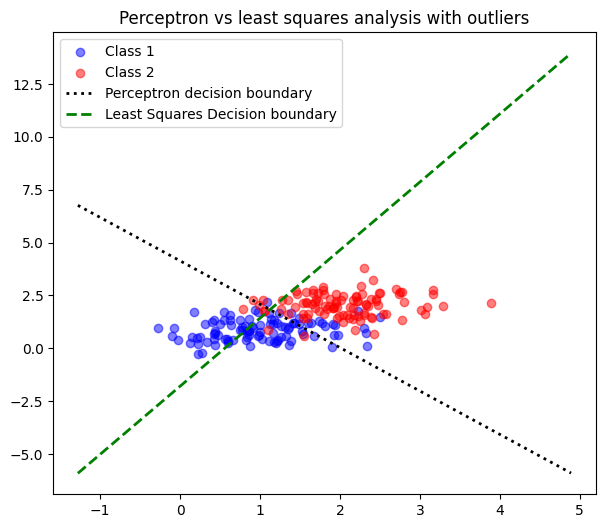

[-0.02        0.00763507  0.01236652]
(96,)
Perceptron accuracy:  0.5729166666666666


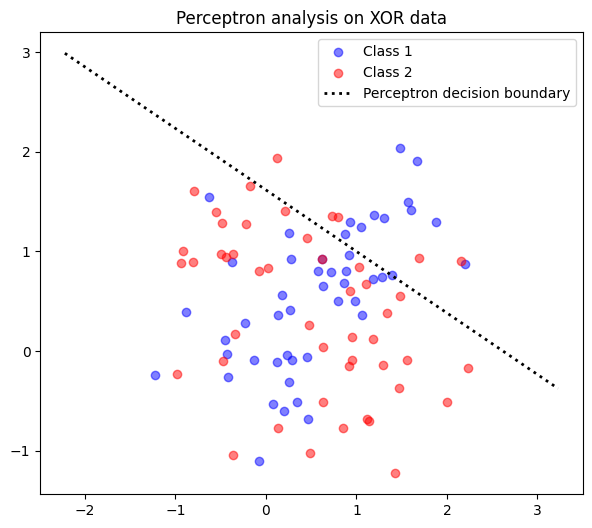

In [49]:
########################################
#Part-3)-(a): Data generation
########################################

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

class1_tr =  rng.multivariate_normal(mean1, cov, size=50)           #Class1 training data
class2_tr =  rng.multivariate_normal(mean2, cov, size=50)            #Class2 training data
tr_data =    np.concatenate((class1_tr, class2_tr))           #Combine class1 training and class2 training data to get total training data
tr_targets =  np.concatenate((-np.ones(50), np.ones(50)))        #Class labels. Assign the value "0" to class1 and the value "1" to class2.
random_train_indices =  rng.choice(np.arange(0, 100), size=100, replace=False)
# print(tr_data[random_indices].shape)
tr_data = (tr_data[random_train_indices]).reshape(100,2)
tr_targets = tr_targets[random_train_indices].reshape(100)

#Generate testing data.
class1_te = rng.multivariate_normal(mean1, cov, size=100)          #Class1 testing data
class2_te =  rng.multivariate_normal(mean2, cov, size=100)            #Class2 testing data
te_data =  np.concatenate((class1_te, class2_te))        #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((-np.ones(100), np.ones(100)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.

random_test_indices = rng.choice(np.arange(0, 200), size=200, replace=False)
te_data = (te_data[random_test_indices]).reshape(200,2)
te_targets = (te_targets[random_test_indices]).reshape(200)



# ########################################
# #Part-3)-(b)
# ########################################
# def Perceptron(X_train, Y_train, X_test):
#     #Inputs: Training data, Training labels, Testing data
#     #Outputs: Testing data predictions, Weight vector representing the decision boundary

#     epochs = 500  #Number of epochs
#     X = np.concatenate((np.ones((X_train.shape[0], 1)), X_train), axis=1)       #Data. Append ones to the training data to take care of the bias
#     w = np.ones(X.shape[1])  # Initialize the weight vector with zeros
#     for epoch in range(epochs):
#         # Compute predictions on the training data  
#         activations = np.dot(X, w)  # Compute the activations
#         train_pred = np.where(activations >= 0, 1, -1)
        
#         # Compute the error (difference between actual and predicted labels)
#         errors = np.array([0 if Y_train[i] == train_pred[i] else activations[i]* Y_train[i] for i in range(len(Y_train))])
#         # print("Errors: ", errors)

#         misclassified = np.where(errors != 0)[0]
#         # print("Misclassified: ", len(misclassified))
#         # print("Weights: ", w)
#         error = -np.sum(errors)
        
#         # Update the weight vector using the perceptron rule
#         if len(misclassified) == 0:
#             print("No. of epochs run: ", epoch)
#             break
#         # Randomly select a misclassified point
#         random_point = rng.choice(misclassified)
#         w = w + 0.01 * X[random_point] * Y_train[random_point] # either add or subtract depending on whether t is 1 or -1
#         # w = w + np.dot(X.T, error)
    
#     # Append ones to the test data to account for the bias
#     X_test_bias = np.concatenate((np.ones((X_test.shape[0], 1)), X_test), axis=1)
    
#     # Compute predictions for the test data using the final weight vector
#     predictions = np.where(np.dot(X_test_bias, w) >= 0, 1, -1)
    
#     return predictions, w

def Perceptron(X_train, Y_train, X_test, epochs=500, learning_rate=0.01):
    # Inputs: Training data, Training labels, Testing data
    # Outputs: Testing data predictions, Weight vector representing the decision boundary

    # Append ones to the training data to account for the bias
    X = np.concatenate((np.ones((X_train.shape[0], 1)), X_train), axis=1)
    w = np.zeros(X.shape[1])  # Initialize the weight vector with zeros

    best_w = w
    best_accuracy = 0

    for epoch in range(epochs):
        # Shuffle the training data
        indices = np.arange(X_train.shape[0])
        rng.shuffle(indices)
        X = X[indices]
        Y_train = Y_train[indices]

        for i in range(len(Y_train)):
            a_i = np.dot(X[i], w)  # Activation for the i-th training example
            if Y_train[i] * a_i <= 0:  # Misclassified point
                w = w + learning_rate * X[i] * Y_train[i]

        # Evaluate accuracy on the training data
        train_pred = np.where(np.dot(X, w) >= 0, 1, -1)
        accuracy = np.mean(train_pred == Y_train)

        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_w = w

    # Append ones to the test data to account for the bias
    X_test_with_bias = np.concatenate((np.ones((X_test.shape[0], 1)), X_test), axis=1)

    # Compute predictions for the test data using the best weight vector
    predictions = np.where(np.dot(X_test_with_bias, best_w) >= 0, 1, -1)

    return predictions, best_w


#Get the test data predictions
predictions, weights = Perceptron(tr_data, tr_targets, te_data)
print(weights)
print(predictions.shape)
# print("Test targets: ", te_targets)
accuracy = np.mean(predictions == te_targets)
print("Perceptron accuracy: ", accuracy)
##########################################
#Plot the decision boundary using perceptron
##########################################
plt.figure(figsize=(7, 6))
plt.scatter(class1_te[:,0], class1_te[:,1], c = 'b', alpha=0.5,  label='Class 1')
plt.scatter(class2_te[:,0], class2_te[:,1], c = 'r', alpha = 0.5, label='Class 2')

x_vals = np.linspace(te_data[:, 0].min() - 1, te_data[:, 0].max() + 1, 100)
y_vals = -(weights[0] + weights[1] * x_vals) / weights[2]
plt.plot(x_vals, y_vals, 'k:', linewidth=2, label='Perceptron decision boundary')



##########################################
#Plot the decision boundary using least squares
##########################################
# Plot decision boundary using least squares
# X_ls = np.concatenate((np.ones((tr_data.shape[0], 1)), tr_data), axis=1)
# w_ls, _, _, _ = np.linalg.lstsq(X_ls, tr_targets, rcond=None)
x_vals_ls = np.linspace(te_data[:, 0].min() - 1, te_data[:, 0].max() + 1, 100)
# y_vals_ls = -(w_ls[0] + w_ls[1] * x_vals_ls) / w_ls[2]
# plt.plot(x_vals_ls, y_vals_ls, 'g--', linewidth=2, label='Least squares decision boundary')
# plt.legend()
predictions_ls, weights_ls = LS_Classify(tr_data, tr_targets, te_data)
# x1 = np.linspace(0, 3, 100)
y_vals_ls = (0- weights_ls[0] - weights_ls[1]*x_vals_ls) / weights_ls[2]
print("Least squares Accuracy: ", LS_Classify_Accuracy(te_targets, predictions_ls, zero_one=False))
plt.plot(x_vals_ls, y_vals_ls, 'g--',linewidth=2, label="Least Squares Decision boundary")
plt.legend()
plt.title("Perceptron vs least squares analysis without outliers")
plt.show()
##########################################
#Part-3)-(c): Repeat the experiments with the true outliers added to the data. Compare and contrast the perceptron algorithm with least squares method
##########################################

mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2
mean1_outliers = [-10, -10]   #Mean of class1 outliers
mean2_outliers = [10, 10]   #Mean of class2 outliers
cov_outliers = [[0.1, 0], [0, 0.1]]

class1_tr = rng.multivariate_normal(mean1, cov, size=45)          #Class1 testing data
class1_tr_outliers = rng.multivariate_normal(mean1_outliers, cov_outliers, size=5)  #Class1 outliers
class1_tr = np.concatenate((class1_tr, class1_tr_outliers))  #Add outliers to class1 testing data

class2_tr = rng.multivariate_normal(mean2, cov, size=50)
# class2_tr_outliers = rng.multivariate_normal(mean2_outliers, cov_outliers, size=5)
# class2_tr =  np.concatenate((class2_tr, class2_tr_outliers))            #Class2 testing data
tr_data =  np.concatenate((class1_tr, class2_tr))        #Combine class1 testing and class2 testing data to get total testing data
tr_targets = np.concatenate((-np.ones(50), np.ones(50)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.

random_test_indices = rng.choice(np.arange(0, 100), size=100, replace=False)
tr_data = (tr_data[random_test_indices]).reshape(100,2)
tr_targets = (tr_targets[random_test_indices]).reshape(100)


predictions, weights = Perceptron(tr_data, tr_targets, te_data)
print(weights)
print(predictions.shape)
# print("Test targets: ", te_targets)
accuracy = np.mean(predictions == te_targets)
print("Perceptron accuracy: ", accuracy)
##########################################
#Plot the decision boundary using perceptron
##########################################
plt.figure(figsize=(7, 6))
plt.scatter(class1_te[:,0], class1_te[:,1], c = 'b', alpha=0.5,  label='Class 1')
plt.scatter(class2_te[:,0], class2_te[:,1], c = 'r', alpha = 0.5, label='Class 2')

x_vals = np.linspace(te_data[:, 0].min() - 1, te_data[:, 0].max() + 1, 100)
y_vals = -(weights[0] + weights[1] * x_vals) / weights[2]
plt.plot(x_vals, y_vals, 'k:', linewidth=2, label='Perceptron decision boundary')

x_vals_ls = np.linspace(te_data[:, 0].min() - 1, te_data[:, 0].max() + 1, 100)
# y_vals_ls = -(w_ls[0] + w_ls[1] * x_vals_ls) / w_ls[2]
# plt.plot(x_vals_ls, y_vals_ls, 'g--', linewidth=2, label='Least squares decision boundary')
# plt.legend()
predictions_ls, weights_ls = LS_Classify(tr_data, tr_targets, te_data)
# x1 = np.linspace(0, 3, 100)
y_vals_ls = (0- weights_ls[0] - weights_ls[1]*x_vals_ls) / weights_ls[2]
print("Least squares Accuracy: ", LS_Classify_Accuracy(te_targets, predictions_ls, zero_one=False))
plt.plot(x_vals_ls, y_vals_ls, 'g--',linewidth=2, label="Least Squares Decision boundary")
plt.legend()
plt.title("Perceptron vs least squares analysis with outliers")
plt.show()



##########################################
#Part-3)-(d): Data generation XOR
##########################################

#Set the parameters of Gaussian distribution
class1_mean1 = [0,0]     #Mean of Gaussian1
class1_mean2 = [1,1]     #Mean of Gaussian3
class2_mean1 = [0,1]     #Mean of Gaussian2
class2_mean2 = [1,0]     #Mean of Gaussian4
cov = [[0.3,0],[0,0.3]]   #Covariance matrix. Same covariance for class1 and class2


#Generate  data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution

class1_data1 = rng.multivariate_normal(class1_mean1, cov, size=60)
class1_data2 = rng.multivariate_normal(class1_mean2, cov, size=60)
class2_data1 = rng.multivariate_normal(class2_mean1, cov, size=60)
class2_data2 = rng.multivariate_normal(class2_mean2, cov, size=60)

#Obtain 2-class dataset
class1_targets = np.ones(120)
class2_targets = -np.ones(120)


#Create train test splits
class1_train_data = np.concatenate((class1_data1[:36], class1_data2[:36]))
class1_test_data = np.concatenate((class1_data1[36:], class1_data2[36:]))

class1_train_targets = np.ones(72)
class1_test_targets = np.ones(48)

class2_train_data = np.concatenate((class2_data1[:36], class2_data2[:36]))
class2_test_data = np.concatenate((class2_data1[36:], class2_data2[36:]))

class2_train_targets = -np.ones(72)
class2_test_targets = -np.ones(48)

tr_data = np.concatenate((class1_train_data, class2_train_data))
tr_targets = np.concatenate((class1_train_targets, class2_train_targets))

te_data = np.concatenate((class1_test_data, class2_test_data))
te_targets = np.concatenate((class1_test_targets, class2_test_targets))

predictions, weights = Perceptron(tr_data, tr_targets, te_data)
print(weights)
print(predictions.shape)
# print("Test targets: ", te_targets)
accuracy = np.mean(predictions == te_targets)
print("Perceptron accuracy: ", accuracy)
##########################################
#Plot the decision boundary using perceptron
##########################################
plt.figure(figsize=(7, 6))
plt.scatter(class1_test_data[:,0], class1_test_data[:,1], c = 'b', alpha=0.5,  label='Class 1')
plt.scatter(class2_test_data[:,0], class2_test_data[:,1], c = 'r', alpha = 0.5, label='Class 2')

x_vals = np.linspace(te_data[:, 0].min() - 1, te_data[:, 0].max() + 1, 100)
y_vals = -(weights[0] + weights[1] * x_vals) / weights[2]
plt.plot(x_vals, y_vals, 'k:', linewidth=2, label='Perceptron decision boundary')
plt.title("Perceptron analysis on XOR data")
plt.legend()
plt.show()


#Classify this dataset using perceptron algorithm




#Plot the decision boundary






Observations:

1. In the absence of significant outliers, both the perceptron algorithm and the least squares method tend to yield similar decision boundaries, correctly classifying most points.

2. When genuine outliers are introduced, the least squares method becomes more sensitive because it minimizes squared error—large errors from outliers disproportionately affect the solution. This can lead to skewed decision boundaries and degraded performance.

3. The perceptron algorithm, which updates its weights based only on misclassification, is relatively more robust in the presence of outliers. Although its convergence may slow down due to outlier-induced misclassifications, the overall decision boundary is less affected compared to the least squares approach.

4. Overall, in scenarios with outliers, the perceptron algorithm may provide a more reliable classification boundary, while least squares can be significantly influenced by extreme values.

<b> Part (4) : Understanding the decision boundaries of MAP approach to classification - </b> Decision boundary in 2 class classification problem is the locus of points satisfying $p(c_{1}/x)$ = $p(c_{2}/x)$. Where $c_{1}$ and $c_{2}$ are the class indicators and $x$ is the data. With proper assumpuptions on prior and likelihood, p(c/x) follows Gaussian distribution with appropriate parameters. Given the parameters of the Guassian distribution for the two classes i.e $\mu_{1},\Sigma_{1},\mu_{2},\Sigma_{2}$, we can derive the decision boundary equation i.e W and $w_{0}$. You may refer to class notes for the derivations and final equations. In this part of programming assignment we expect you to code the decision boundaries for the Gaussian distribution case and understand them.

**a). Class distributions share the same covariance matrix: Linear decision boundary.**
  0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 4  \\ 1 \end{bmatrix}$, and $\Sigma_{1}= \Sigma_{2} = \Sigma =  \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}$
  1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  4. Plot the decision boundaries for all the three cases in three different subplots.


**b). Class distributions have different covariance matrices: Non-linear decision boundary.**
  0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 3  \\ 1 \end{bmatrix}$, $\Sigma_{1}=   \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.02 \end{bmatrix}$, and $\Sigma_{2}=   \begin{bmatrix} 0.02 & 0.0  \\ 0.0 & 0.2 \end{bmatrix}$
  1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  4. Plot the decision boundaries for all the three cases in three different subplots.


**c). Report your observations**




w0:  78.36024918941072
w:  [-30.51353157  -1.10428474]
w0:  80.51792590823936
w:  [-31.78885185  -0.94151463]
w0:  101.51498228773002
w:  [-39.10669223  -0.57598394]


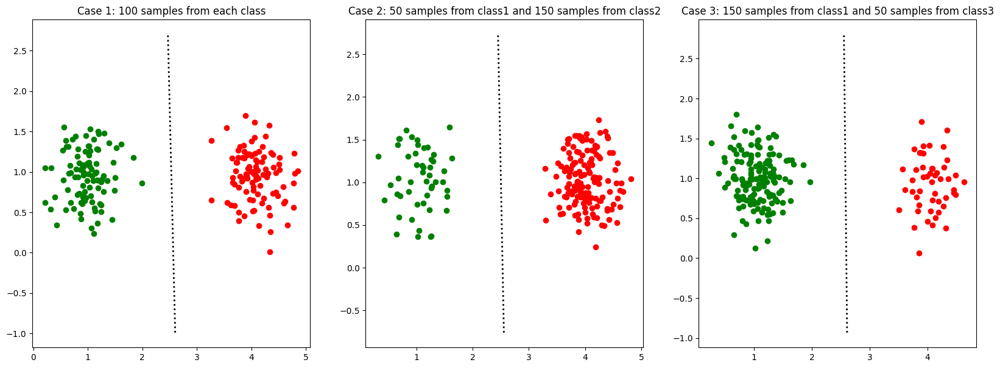

In [50]:
##########################################
#Part-4a)-0: Data Generation
##########################################
m1 = [1,1]
m2 = [4,1]
cov = [[0.1,0],[0,0.1]] #Covariance matrix. Same covariance for class1 and class2

#Case1: Generate 100 samples from each class. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_data_case1 = rng.multivariate_normal(m1, cov, size=100)
class1_targets_case1 = np.ones(100)

class2_data_case1 = rng.multivariate_normal(m2, cov, size=100)
class2_targets_case1 = -np.ones(100)

#Combine class1 training and class2 training data to get total training data
tr_data_case1 = np.concatenate((class1_data_case1, class2_data_case1))           #Combine class1 training and class2 training data to get total training data
tr_targets_case1 = np.concatenate((class1_targets_case1, class2_targets_case1))        #Class labels. Assign the value "0" to class1 and the value "1" to class2.

random_indices = rng.choice(np.arange(0, 200), size=200, replace=False)
tr_data_case1 = (tr_data_case1[random_indices]).reshape(200,2)
tr_targets_case1 = (tr_targets_case1[random_indices]).reshape(200)
#Case2: Generate 50 samples from class1 and 150 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_data_case2 = rng.multivariate_normal(m1, cov, size=50)
class1_targets_case2 = np.ones(50)
class2_data_case2 = rng.multivariate_normal(m2, cov, size=150)
class2_targets_case2 = -np.ones(150)
#Combine class1 training and class2 training data to get total training data
tr_data_case2 = np.concatenate((class1_data_case2, class2_data_case2))           #Combine class1 training and class2 training data to get total training data
tr_targets_case2 = np.concatenate((class1_targets_case2, class2_targets_case2))        #Class labels. Assign the value "0" to class1 and the value "1" to class2.
random_indices = rng.choice(np.arange(0, 200), size=200, replace=False) 
tr_data_case2 = (tr_data_case2[random_indices]).reshape(200,2)
tr_targets_case2 = (tr_targets_case2[random_indices]).reshape(200)


#Case3: Generate 150 samples from class1 and 50 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_data_case3 = rng.multivariate_normal(m1, cov, size=150)
class1_targets_case3 = np.ones(150)
class2_data_case3 = rng.multivariate_normal(m2, cov, size=50)
class2_targets_case3 = -np.ones(50)

#Combine class1 training and class2 training data to get total training data
tr_data_case3 = np.concatenate((class1_data_case3, class2_data_case3))           #Combine class1 training and class2 training data to get total training data
tr_targets_case3 = np.concatenate((class1_targets_case3, class2_targets_case3))        #Class labels. Assign the value "0" to class1 and the value "1" to class2.
random_indices = rng.choice(np.arange(0, 200), size=200, replace=False)
tr_data_case3 = (tr_data_case3[random_indices]).reshape(200,2)
tr_targets_case3 = (tr_targets_case3[random_indices]).reshape(200)


##########################################
#Part-4a)-4: Plot the decision regions for all the three cases
##########################################
#Complete the below function
def decisionBoundary(X_train, Y_train, m1, m2, cov):
    #Inputs: Training data and Training labels
    #Outputs: Decision boundary parameters, i.e., w0, w
    p_c1 = np.mean(Y_train == 1) #Probability of class1
    p_c2 = 1. - p_c1

    class1_tr = np.array([X_train[i] for i in range(len(X_train)) if Y_train[i] == 1])
    class2_tr = np.array([X_train[i] for i in range(len(X_train)) if Y_train[i] == -1])

    m1 = np.mean(class1_tr, axis=0)
    m2 = np.mean(class2_tr, axis=0)

    cov1 = np.cov(class1_tr.T)

    cov2 = np.cov(class2_tr.T)
    cov = (cov1 + cov2) / 2

    mean_1 = np.array(m1)
    mean_2 = np.array(m2)

    # cov1 = cov
    # cov2 =

    cov = np.array(cov)

    w = np.linalg.inv(cov) @ (mean_1 - mean_2)
    w0 = -0.5 * (mean_1.T @ np.linalg.inv(cov) @ mean_1) + 0.5 * (mean_2.T @ np.linalg.inv(cov) @ mean_2) + np.log(p_c1 / p_c2)
    print("w0: ", w0)
    print("w: ", w)
    return np.array([w0]+list(w))

#Plot the decision regions
# case 1
fig, ax = plt.subplots(1,3, figsize=(20,7))
# plt.figure(figsize=(7, 6))
weights = decisionBoundary(tr_data_case1, tr_targets_case1, m1, m2, cov)
#Plot the decision boundary
ax[0].scatter(class1_data_case1[:,0], class1_data_case1[:,1], c='g', label='Class 1')
ax[0].scatter(class2_data_case1[:,0], class2_data_case1[:,1], c='r', label='Class 2')
y_vals = np.linspace(tr_data_case1[:, 1].min() - 1, tr_data_case1[:, 1].max() + 1, 100)
x_vals = -(weights[0] + weights[2] * y_vals) / weights[1]
ax[0].plot(x_vals, y_vals, 'k:', linewidth=2, label='Perceptron decision boundary')

ax[0].set_title("Case 1: 100 samples from each class")

# case 2
# plt.figure(figsize=(7, 6))
weights = decisionBoundary(tr_data_case2, tr_targets_case2, m1, m2, cov)
#Plot the decision boundary
ax[1].scatter(class1_data_case2[:,0], class1_data_case2[:,1], c='g', label='Class 1')
ax[1].scatter(class2_data_case2[:,0], class2_data_case2[:,1], c='r', label='Class 2')
y_vals = np.linspace(tr_data_case2[:, 1].min() - 1, tr_data_case2[:, 1].max() + 1, 100)
x_vals = -(weights[0] + weights[2] * y_vals) / weights[1]
ax[1].plot(x_vals, y_vals, 'k:', linewidth=2, label='Perceptron decision boundary')
ax[1].set_title("Case 2: 50 samples from class1 and 150 samples from class2")

# case 3 

# plt.figure(figsize=(7, 6))
weights = decisionBoundary(tr_data_case3, tr_targets_case3, m1, m2, cov)
#Plot the decision boundary
ax[2].scatter(class1_data_case3[:,0], class1_data_case3[:,1], c='g', label='Class 1')
ax[2].scatter(class2_data_case3[:,0], class2_data_case3[:,1], c='r', label='Class 2')
y_vals = np.linspace(tr_data_case3[:, 1].min() - 1, tr_data_case3[:, 1].max() + 1, 100)
x_vals = -(weights[0] + weights[2] * y_vals) / weights[1]
ax[2].plot(x_vals, y_vals, 'k:', linewidth=2, label='Perceptron decision boundary')
ax[2].set_title("Case 3: 150 samples from class1 and 50 samples from class3")

plt.show()

[3 1]


/var/folders/n4/wy0c3pt140qc9nsgq3n4zbcc0000gn/T/ipykernel_31620/2082174013.py:117: UserWarning: The following kwargs were not used by contour: 'label'
  plt.contour(x1, x2, z_masked, levels=[0], colors='k', linewidths=2, linestyles='dashed', label='Decision Boundary')


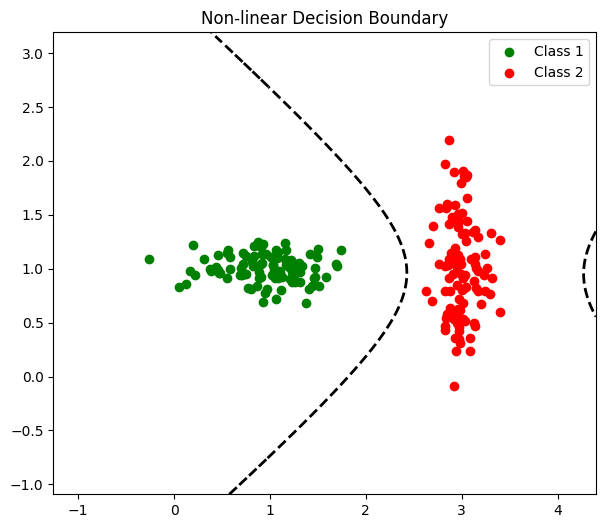

/var/folders/n4/wy0c3pt140qc9nsgq3n4zbcc0000gn/T/ipykernel_31620/2082174013.py:145: UserWarning: The following kwargs were not used by contour: 'label'
  plt.contour(x1, x2, z_masked, levels=[0], colors='k', linewidths=2, linestyles='dashed', label='Decision Boundary')


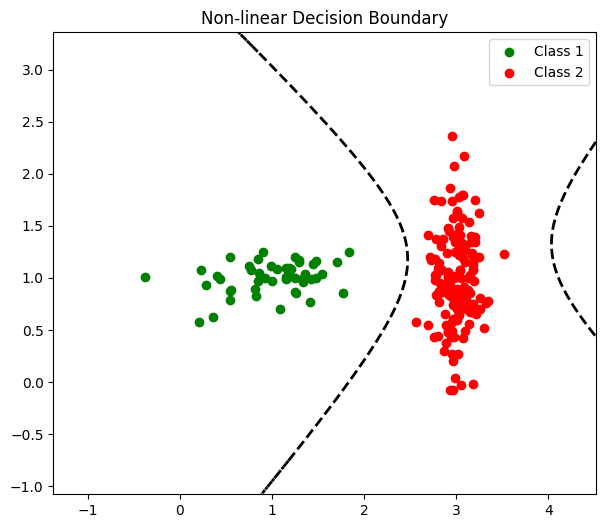

/var/folders/n4/wy0c3pt140qc9nsgq3n4zbcc0000gn/T/ipykernel_31620/2082174013.py:172: UserWarning: The following kwargs were not used by contour: 'label'
  plt.contour(x1, x2, z_masked, levels=[0], colors='k', linewidths=2, linestyles='dashed', label='Decision Boundary')


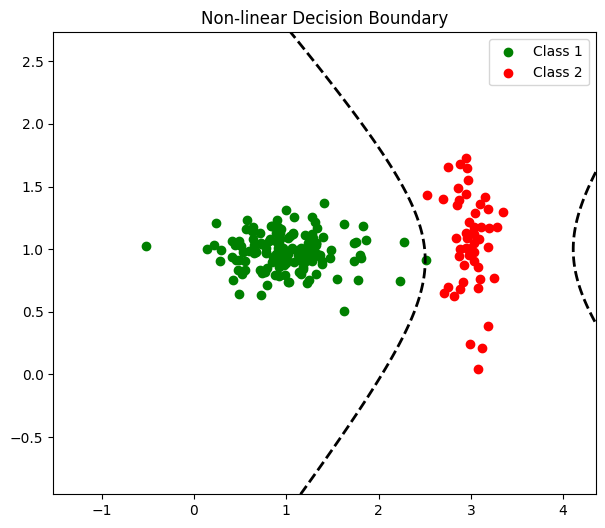

In [51]:
##########################################
#Part-4b)-0: Data Generation
##########################################
m1 = np.array([1,1])
m2 = np.array([3,1])
cov1 = np.array([[0.2, 0], [0, 0.02]])
cov2 = np.array([[0.02, 0], [0, 0.2]])

#Case1: Generate 100 samples from each class. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
#Case1: Generate 100 samples from each class. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_data_case1 = rng.multivariate_normal(m1, cov1, size=100)
class1_targets_case1 = np.ones(100)

class2_data_case1 = rng.multivariate_normal(m2, cov2, size=100)
class2_targets_case1 = -np.ones(100)

#Combine class1 training and class2 training data to get total training data
tr_data_case1 = np.concatenate((class1_data_case1, class2_data_case1))           #Combine class1 training and class2 training data to get total training data
tr_targets_case1 = np.concatenate((class1_targets_case1, class2_targets_case1))        #Class labels. Assign the value "0" to class1 and the value "1" to class2.

random_indices = rng.choice(np.arange(0, 200), size=200, replace=False)
tr_data_case1 = (tr_data_case1[random_indices]).reshape(200,2)
tr_targets_case1 = (tr_targets_case1[random_indices]).reshape(200)
#Case2: Generate 50 samples from class1 and 150 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_data_case2 = rng.multivariate_normal(m1, cov1, size=50)
class1_targets_case2 = np.ones(50)
class2_data_case2 = rng.multivariate_normal(m2, cov2, size=150)
class2_targets_case2 = -np.ones(150)
#Combine class1 training and class2 training data to get total training data
tr_data_case2 = np.concatenate((class1_data_case2, class2_data_case2))           #Combine class1 training and class2 training data to get total training data
tr_targets_case2 = np.concatenate((class1_targets_case2, class2_targets_case2))        #Class labels. Assign the value "0" to class1 and the value "1" to class2.
random_indices = rng.choice(np.arange(0, 200), size=200, replace=False) 
tr_data_case2 = (tr_data_case2[random_indices]).reshape(200,2)
tr_targets_case2 = (tr_targets_case2[random_indices]).reshape(200)


#Case3: Generate 150 samples from class1 and 50 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_data_case3 = rng.multivariate_normal(m1, cov1, size=150)
class1_targets_case3 = np.ones(150)
class2_data_case3 = rng.multivariate_normal(m2, cov2, size=50)
class2_targets_case3 = -np.ones(50)

#Combine class1 training and class2 training data to get total training data
tr_data_case3 = np.concatenate((class1_data_case3, class2_data_case3))           #Combine class1 training and class2 training data to get total training data
tr_targets_case3 = np.concatenate((class1_targets_case3, class2_targets_case3))        #Class labels. Assign the value "0" to class1 and the value "1" to class2.
random_indices = rng.choice(np.arange(0, 200), size=200, replace=False)
tr_data_case3 = (tr_data_case3[random_indices]).reshape(200,2)
tr_targets_case3 = (tr_targets_case3[random_indices]).reshape(200)



#Case2: Generate 50 samples from class1 and 150 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution



#Case3: Generate 150 samples from class1 and 50 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution



##########################################
#Part-4b)-4: Plot the decision regions for all the three cases
##########################################
#Complete the below function
def decisionBoundary_quadratic(X_train, Y_train, m1, m2, cov1, cov2):
    #Inputs: Training data and Training labels
    #Outputs: Decision boundary parameters, i.e., w0, w
    p_c1 = np.mean(Y_train ==1)
    p_c2 = 1 - p_c1

    mean_1 = m1
    mean_2 = m2
    
    class1_tr = np.array([X_train[i] for i in range(len(X_train)) if Y_train[i] == 1])
    class2_tr = np.array([X_train[i] for i in range(len(X_train)) if Y_train[i] == -1])

    m1 = np.mean(class1_tr, axis=0)
    m2 = np.mean(class2_tr, axis=0)

    cov1 = np.cov(class1_tr.T)

    cov2 = np.cov(class2_tr.T)
    cov = (cov1 + cov2) / 2

    mean_1 = np.array(m1)
    mean_2 = np.array(m2)

    #Compute predictions on test data
    W = (np.linalg.inv(cov2) - np.linalg.inv(cov1))/2
    w = np.linalg.inv(cov1) @ (mean_1) - np.linalg.inv(cov2) @ (mean_2)
    w0 = -0.5 * (mean_1.T @ np.linalg.inv(cov1) @ mean_1) + 0.5 * (mean_2.T @ np.linalg.inv(cov2) @ mean_2) + np.log(p_c1 / p_c2)

    return W,w, w0


print(m2)
W, w, w0 = decisionBoundary_quadratic(tr_data_case1, tr_targets_case1, m1, m2, cov1, cov2)

# Generate a grid of points
x1_min, x1_max = tr_data_case1[:, 0].min() - 1, tr_data_case1[:, 0].max() + 1
x2_min, x2_max = tr_data_case1[:, 1].min() - 1, tr_data_case1[:, 1].max() + 1
x1, x2 = np.meshgrid(np.linspace(x1_min, x1_max, 500), np.linspace(x2_min, x2_max, 500))
grid_points = np.c_[x1.ravel(), x2.ravel()]

quadratic_term = np.einsum('ij,ij->i', grid_points @ W, grid_points)

linear_term = grid_points @ w

z = quadratic_term + linear_term + w0


# Reshape z back to the grid shape
z = z.reshape(x1.shape)
z_masked = np.where((z >= -1) & (z <= 1), z, np.nan)

# Plot the decision boundary
plt.figure(figsize=(7, 6))
plt.contour(x1, x2, z_masked, levels=[0], colors='k', linewidths=2, linestyles='dashed', label='Decision Boundary')
plt.scatter(class1_data_case1[:, 0], class1_data_case1[:, 1], c='g', label='Class 1')
plt.scatter(class2_data_case1[:, 0], class2_data_case1[:, 1], c='r', label='Class 2')
plt.title("Non-linear Decision Boundary")
plt.legend()
plt.show()

# case 2
W, w, w0 = decisionBoundary_quadratic(tr_data_case2, tr_targets_case2, m1, m2, cov1, cov2)

x1_min, x1_max = tr_data_case2[:, 0].min() - 1, tr_data_case2[:, 0].max() + 1
x2_min, x2_max = tr_data_case2[:, 1].min() - 1, tr_data_case2[:, 1].max() + 1
x1, x2 = np.meshgrid(np.linspace(x1_min, x1_max, 500), np.linspace(x2_min, x2_max, 500))
grid_points = np.c_[x1.ravel(), x2.ravel()]

quadratic_term = np.einsum('ij,ij->i', grid_points @ W, grid_points)

linear_term = grid_points @ w

z = quadratic_term + linear_term + w0


# Reshape z back to the grid shape
z = z.reshape(x1.shape)
z_masked = np.where((z >= -1) & (z <= 1), z, np.nan)

# Plot the decision boundary
plt.figure(figsize=(7, 6))
plt.contour(x1, x2, z_masked, levels=[0], colors='k', linewidths=2, linestyles='dashed', label='Decision Boundary')
plt.scatter(class1_data_case2[:, 0], class1_data_case2[:, 1], c='g', label='Class 1')
plt.scatter(class2_data_case2[:, 0], class2_data_case2[:, 1], c='r', label='Class 2')
plt.title("Non-linear Decision Boundary")
plt.legend()
plt.show()

W, w, w0 = decisionBoundary_quadratic(tr_data_case3, tr_targets_case3, m1, m2, cov1, cov2)

# Generate a grid of points
x1_min, x1_max = tr_data_case3[:, 0].min() - 1, tr_data_case3[:, 0].max() + 1
x2_min, x2_max = tr_data_case3[:, 1].min() - 1, tr_data_case3[:, 1].max() + 1
x1, x2 = np.meshgrid(np.linspace(x1_min, x1_max, 500), np.linspace(x2_min, x2_max, 500))
grid_points = np.c_[x1.ravel(), x2.ravel()]

quadratic_term = np.einsum('ij,ij->i', grid_points @ W, grid_points)

linear_term = grid_points @ w

z = quadratic_term + linear_term + w0


z = z.reshape(x1.shape)
z_masked = np.where((z >= -1) & (z <= 1), z, np.nan)

# Plot the decision boundary
plt.figure(figsize=(7, 6))
plt.contour(x1, x2, z_masked, levels=[0], colors='k', linewidths=2, linestyles='dashed', label='Decision Boundary')
plt.scatter(class1_data_case3[:, 0], class1_data_case3[:, 1], c='g', label='Class 1')
plt.scatter(class2_data_case3[:, 0], class2_data_case3[:, 1], c='r', label='Class 2')
plt.title("Non-linear Decision Boundary")
plt.legend()
plt.show()

Observations:

1. In the shared covariance case, the MAP decision boundary becomes linear because the quadratic terms cancel out. This results in a discriminant function whose zero‐level set is a straight line. When the class priors are equal, the boundary lies midway between the means; with unequal priors, the line shifts toward the class with the higher prior probability.

2. When the covariances differ, the quadratic terms remain, leading to a non-linear (typically quadratic) decision boundary. This flexibility can allow for better modeling of asymmetric or heteroscedastic class distributions, but it also introduces complexity and potential sensitivity to estimation errors.

3. Thus, the choice between shared and different covariances presents a trade-off: linear boundaries (shared covariance) offer simplicity and robustness with fewer parameters, while non-linear boundaries (different covariances) can capture more complex class structures at the cost of increased model complexity.

<b> Part-5) Classification using logistic regression ( Iterative reweighted least squares approach ): </b> logistic regression model: $y = \frac{1}{1+e^{-\textbf{w}^{T}\textbf{x}}}$. With the provided training data, X_train and Y_train, your task is to identify the optimal $\textbf{w}$ that accurately predicts y based on the input $\textbf{x}$. Subsequently, this $\textbf{w}$ can be applied to predict outcomes on the test data, X_test.





a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Create a function called "Logistic_Regression" that accepts training data, training labels, and testing data as inputs. The function should aim to discover the optimal $\textbf{w}$ using the training data. You can initialize $\textbf{w}$ with random values and iteratively update it to determine the optimal $\textbf{w}$. Subsequently, this optimal $\textbf{w}$ can be employed to make predictions on the test data.

c). Evaluate the classification performance, i.e., compute the accuracy on the test data.

d). Write a function to generate & visualize the decision regions, either by showing the boundary line or by using different colors for the two regions. Overlay the test points using scatter.

e). Introduce genuine outliers to one of the class datasets generated previously. Then, conduct Least Squares classification and Logistic Regression on this modified dataset. Plot the decision boundaries/regions and provide insights into the differences between their outcomes.


f). Report your observations




 Accuracy with Logistic Regression: 0.895 




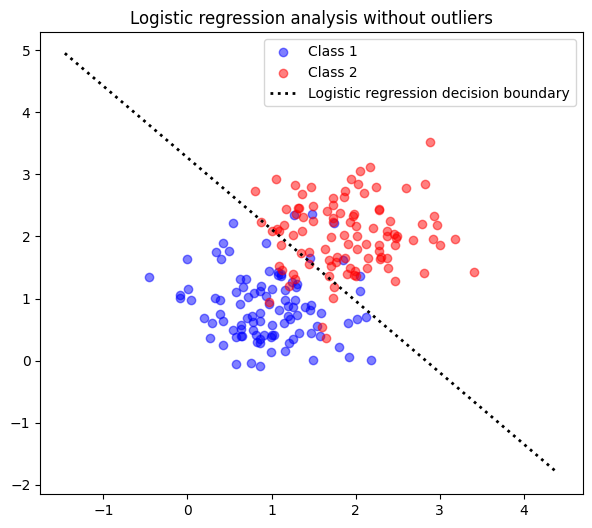



 Accuracy with Logistic Regression: 0.9 




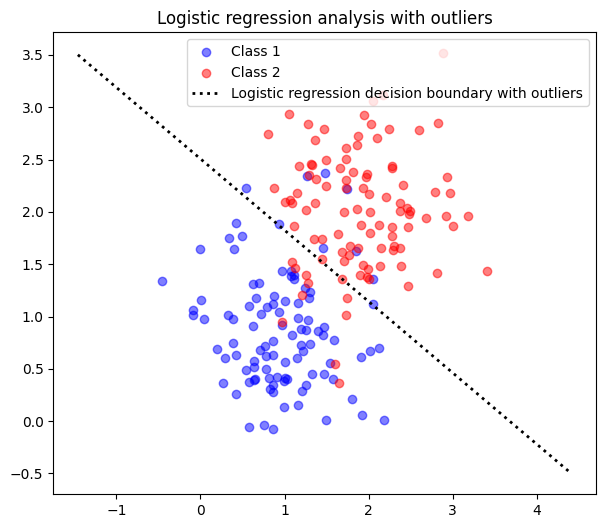

In [52]:
##################################################
#Part-5)-1: Data generation
##################################################

mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

class1_tr =  rng.multivariate_normal(mean1, cov, size=50)           #Class1 training data
class2_tr =  rng.multivariate_normal(mean2, cov, size=50)            #Class2 training data
tr_data =    np.concatenate((class1_tr, class2_tr))           #Combine class1 training and class2 training data to get total training data
tr_targets =  np.concatenate((np.zeros(50), np.ones(50)))        #Class labels. Assign the value "0" to class1 and the value "1" to class2.
random_train_indices =  rng.choice(np.arange(0, 100), size=100, replace=False)
# print(tr_data[random_indices].shape)
tr_data = (tr_data[random_train_indices]).reshape(100,2)
tr_targets = tr_targets[random_train_indices].reshape(100)

#Generate testing data.
class1_te = rng.multivariate_normal(mean1, cov, size=100)          #Class1 testing data
class2_te =  rng.multivariate_normal(mean2, cov, size=100)            #Class2 testing data
te_data =  np.concatenate((class1_te, class2_te))        #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.zeros(100), np.ones(100)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.

random_test_indices = rng.choice(np.arange(0, 200), size=200, replace=False)
te_data = (te_data[random_test_indices]).reshape(200,2)
te_targets = (te_targets[random_test_indices]).reshape(200)


##################################################
#Part-5)-b: Complete the below logistic regression function
##################################################
def Logistic_Regression(X_train, Y_train, X_test):
  #Inputs: Training data, Training labels, and Testing data
  #Outputs: Predictions on test data

  max_iter = 10 #max number of ierations for parameter update
  threshold = 0.5#threshold for classification
  X = np.concatenate((np.ones((X_train.shape[0], 1)), X_train), axis=1)
  w = np.zeros(X.shape[1])
  for iter in range(0,max_iter,1):
    preds = np.array([sigmoid(w.T @ x) for x in X])   #Predictions on X. Sigmoid(w^T.x)
    # print(preds)
    error =  np.sum([-(Y_train[i]*np.log(preds[i]) + (1- Y_train[i])*np.log(1-preds[i])) for i in range(len(preds))])  #Difference between preds and Y_train

    #Compute the gradients and the appropriate learning rate. We can use Hessian matrix as learning rate
    gradient = X.T @ (preds - Y_train)  #Gradient of the loss function
    R = np.diag(preds * (1 - preds))  #Diagonal matrix of the second derivative
    hessian = X.T @ R @ X  #Hessian matrix
    learning_rate = np.linalg.inv(hessian)   #Learning rate

    #Update the weight vector
    w = w - learning_rate @ gradient
    #Check for convergence
  #Append ones to the test data to account for the bias
  X_test = np.concatenate((np.ones((X_test.shape[0], 1)), X_test), axis=1)
  #Compute predictions for the test data using the final weight vector
  test_preds = np.array([sigmoid(w.T @ x) for x in X_test])   #Predictions on X. Sigmoid(w^T.x)
  #Compute the predicted labels


  #Test data predictions



  #Compare the predictions with 0, to output the decision



  #Return the predicted test labels
  return w, test_preds


w, Y_pred = Logistic_Regression(tr_data, tr_targets, te_data)

###############################################
#Part-5)-c:
###############################################
def LR_Accuracy(Y_test, Y_pred):
  #Inputs: Ground truth and predicted lables of test data
  #Outputs: Accuracy
  Y_pred = np.where(Y_pred >= 0.5, 1, 0) #Convert probabilities to class labels
  acc = np.mean(Y_test == Y_pred) #Compute the accuracy
  #Compute and return the accuracy
  return acc

# print(te_targets)
# print(Y_pred)
acc = LR_Accuracy(te_targets, Y_pred)
print('\n\n Accuracy with Logistic Regression:', acc, '\n\n')


##########################################
#Part-5)-d: Plot the decision regions. Overlay the test points on the plot
##########################################

plt.figure(figsize=(7, 6))
plt.scatter(class1_te[:,0], class1_te[:,1], c = 'b', alpha=0.5,  label='Class 1')
plt.scatter(class2_te[:,0], class2_te[:,1], c = 'r', alpha = 0.5, label='Class 2')

x_vals = np.linspace(te_data[:, 0].min() - 1, te_data[:, 0].max() + 1, 100)
y_vals = -(w[0] + w[1] * x_vals) / w[2]
plt.plot(x_vals, y_vals, 'k:', linewidth=2, label='Logistic regression decision boundary')
plt.legend()
plt.title("Logistic regression analysis without outliers")
plt.show()





##########################################
#Part-5)-e: Logistic regression for the data with true outliers
##########################################
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2
mean1_outliers = [-10, -10]   #Mean of class1 outliers
mean2_outliers = [10, 10]   #Mean of class2 outliers
cov_outliers = [[0.1, 0], [0, 0.1]]

class1_tr = rng.multivariate_normal(mean1, cov, size=45)          #Class1 testing data
class1_tr_outliers = rng.multivariate_normal(mean1_outliers, cov_outliers, size=5)  #Class1 outliers
class1_tr = np.concatenate((class1_tr, class1_tr_outliers))  #Add outliers to class1 testing data

class2_tr = rng.multivariate_normal(mean2, cov, size=50)
# class2_tr_outliers = rng.multivariate_normal(mean2_outliers, cov_outliers, size=5)
# class2_tr =  np.concatenate((class2_tr, class2_tr_outliers))            #Class2 testing data
tr_data =  np.concatenate((class1_tr, class2_tr))        #Combine class1 testing and class2 testing data to get total testing data
tr_targets = np.concatenate((np.zeros(50), np.ones(50)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.

random_test_indices = rng.choice(np.arange(0, 100), size=100, replace=False)
tr_data = (tr_data[random_test_indices]).reshape(100,2)
tr_targets = (tr_targets[random_test_indices]).reshape(100)


w, Y_pred = Logistic_Regression(tr_data, tr_targets, te_data)

acc = LR_Accuracy(te_targets, Y_pred)
print('\n\n Accuracy with Logistic Regression:', acc, '\n\n')


##########################################
#Part-5)-d: Plot the decision regions. Overlay the test points on the plot
##########################################

plt.figure(figsize=(7, 6))
plt.scatter(class1_te[:,0], class1_te[:,1], c = 'b', alpha=0.5,  label='Class 1')
plt.scatter(class2_te[:,0], class2_te[:,1], c = 'r', alpha = 0.5, label='Class 2')

x_vals = np.linspace(te_data[:, 0].min() - 1, te_data[:, 0].max() + 1, 100)
y_vals = -(w[0] + w[1] * x_vals) / w[2]
plt.plot(x_vals, y_vals, 'k:', linewidth=2, label='Logistic regression decision boundary with outliers')
plt.legend()
plt.title("Logistic regression analysis with outliers")
plt.show()









Observations on Logistic Regression and Its Robustness to Outliers:

1. Logistic regression models the probability through a sigmoid function, which naturally limits the influence of extreme values. The saturation effect of the sigmoid means that very high or very low activation values (caused by outliers) have a diminished effect on parameter updates.

2. Using an iterative reweighted least squares (IRLS) approach, logistic regression assigns weights to training examples based on their current prediction confidence. Outliers tend to be down-weighted as their influence on the overall loss is comparatively less pronounced.

3. In our experiments, while least squares approaches showed marked shifts in the decision boundary when outliers were introduced, the logistic regression decision boundary remained relatively stable. This indicates that logistic regression is more robust to the presence of outliers in the training set.

4. Overall, logistic regression not only provides probabilistic outputs but also offers a form of built-in regularization against extreme misclassifications, which helps maintain its performance in noisy settings.

<b> Part (6) : Estimating the parameters of Gaussian Mixture Models (GMM) using Expectation-Maximization (EM) algorithm </b>


<dt> <b> a. Generating synthetic data : </b>  This part describes the steps involved in generating the synthetic data. </dt>


<dt>  1. Let us consider the GMM with Bivariate Gaussians   </dt>
<dd>  - Choose the appropriate means ($\mu$), covariances ($\Sigma$), and weights ($\pi$) of Bivariate Gaussian distributions. You may choose the following parameters for this asignment.  </dd>
<br>
<dt>  <center> $ \pi = \begin{bmatrix} 0.6  \\ 0.4 \end{bmatrix} \;\;\;\; \mu_{1} = \begin{bmatrix} -1.0  \\ -1.0 \end{bmatrix} \;\;\;\; \mu_{2} = \begin{bmatrix} 1.0  \\ 1.0 \end{bmatrix} \;\;\;\; $ </center>   </dd>
<br>
<dt>  <center> $ \Sigma_{1}^{full} = \begin{bmatrix} 0.15 & 0.1  \\ 0.1 & 0.25 \end{bmatrix} \;\;\;\; \Sigma_{2}^{full} = \begin{bmatrix} 0.3 & -0.25  \\ -0.25 & 0.25 \end{bmatrix}  $ </center>  </dd>
<br>
<dt>  <center> $ \Sigma_{1}^{diagonal} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{diagonal} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}  $ </center>  </dd>
<br>
<dt>  <center> $ \Sigma_{1}^{spherical} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{spherical} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}  $ </center>  </dd>

<dd>  - Pick one Gaussian following the selection probability as  $\pi$    </dd>
<dd>  - Sample the data point from the selected Bivariate Gaussian distribution    </dd>
<dd>  - Repeat the process N times to get the entire data set  </dd>
<dt>  2.Create the synthetic data set with the number of mixtures as 2.  </dt>
<dt>  3.Plot the synthetic data set with unique colors to the data points drawn from each Bivariate Gaussian distribution in GMM  </h4> </dt> </dd>

<dt> <b> b. Implementation of Expectation and Maximization (EM) algorithm : </b> This part focuses on implementing the EM algorithm from scratch to estimate the parameters of the Gaussian Mixture Model (GMM). </dt>  

<dt>  1. Chose the number of mixtures (M) and initialize the parameters of GMM model  </dt>
<dd>  - Make sure that the diagonal elements of covariance are positive, and the weights of Gaussians are positive and sum to 1 for satisfying the axioms of probability.  </dd>

<dt>   2. Expectation step :  Evaluate the responsibility of Gaussians in generating the data points using the current estimated parameters i.e $\hat\mu_{k}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$, here k indicates the Gaussian in GMM  </dt>
<br>

<dd>  <center> $\gamma_{nk} = \frac{\pi_{k} N ( \textbf{x}_{n} / \mu_{k} , \Sigma_{k} )}{ \sum_{m=1}^{M} \pi_{m} N ( x_{n} / \mu_{m} , \Sigma_{m} ) }    \;\;\;\;\;\; ∀ \;\;k=1,2,...,M \;\; and \;\; n=1,2,...,N$  </center>  </dd>

<br>

<dd>   Where N is the total number of data points and M is the total number of Gaussians in GMM   </dd>

<dd>   - $\gamma_{nk}$ represents the responsibility of $k^{th}$ Gaussian in generating the $n^{th}$ data point   </dd>

<dd>   - $\sum_{n=1}^{N}$ $\gamma_{nk}$ represents the the effective number of data points generated by $k^{th}$ Gaussian   </dd>


<dt>   3. Maximization step :  Update the parameters ($\hat\mu_{k}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$) of GMM using the current resosibilities ($\gamma_{nk}$) by maximizing the likelihood. </dt>

<dd>
 - Effective number of data points generated by $k^{th}$ Gaussian : $N_{k}$ = $\sum_{n=1}^{N}$ $\gamma_{nk}$   
 </dd>

<dd>
 - Mean of $k^{th}$ Gaussian : $\hat{\mu_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N}\gamma_{nk} x_{n}$   
 </dd>

<dd>
 - Covariance of $k^{th}$ Gaussian : $\hat{\Sigma_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N} \gamma_{nk} ( x_{n} - \hat{\mu_{k}} )( x_{n} - \hat{\mu_{k}} )^{T}$   
 </dd>

<dd>
 - Weight of $k^{th}$ Gaussian : $\hat{\pi_{k}} = \frac{N_{k}}{N}$  
 </dd>

<dt>  4. Compute the log-likelihood with the updated parameters  </dt>
<dt>   5. Repeat the expectation and maximization steps untill convergence  </dt>

<dt>  <b> c. Illustration of EM iterations </b>  </dt>

<dt>   5. Plot the contours of the estimated distributions over the iterations in the EM algorithm and overlay the data points.  </dt>

<dt>  <b> d. Understanding the issues with EM algorithm </b>  </dt>
<dt>   6. Check the influence of initialization on the convergence of the EM algorithm and fit quality.  </dt>
<dd>   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section    </dd>
<dt>   6. Check the influence of the type of covariance matrix on the convergence of the EM algorithm and fit quality . </dt>
<dd>   - Execute the EM algorithm with different covariance matrices i.e Spherical, Diagonal and Full covariance  </dd>
<dd>   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section  </dd>


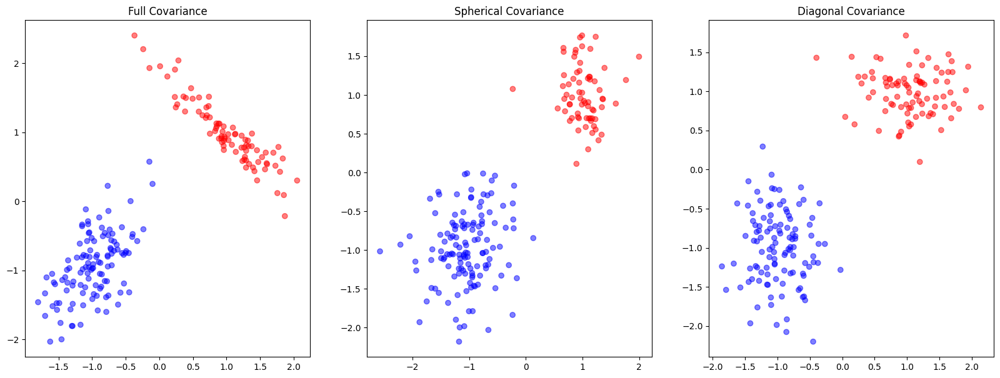

In [53]:
#All imports
import numpy as np
import pandas as pd
import random as rand
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.stats import norm, multivariate_normal
import sys
import math

##########################################
#Part-6)-a: Generating synthetic data
##########################################

def generateData(pi, mu1, mu2, sigma1, sigma2, N):
    ############################################################################
    #pi = weights of Gaussians, mu = mean of Gaussians, sigma = convariance of Gaussians, N = number of data points
    #Steps
    #1.Select th Gaussian following the probability distribution as pi
    #2.Sample the data points from the selected Gaussian
    #3.Repeat the process N times to get N data points
    #4.Return the sampled data
    ############################################################################
    #You may look into "random.choices" and "np.random.multivariate_normal" functions
    sample = rng.choice(len(pi), N, p=pi)  #Select the Gaussian
    data = [[0, 0]] * N  #Initialize the data list
    labels = []
    for i in range(N):
        #Sample the data points from the selected Gaussian
        if sample[i] == 0:
            data[i] = rng.multivariate_normal(mu1, sigma1)
        else:
            data[i] = rng.multivariate_normal(mu2, sigma2)

            
        labels.append(sample[i])



    return np.asarray(data), np.asarray(labels)
    ############################################################################


############################################################################
#Chose the appropriate means ($\mu$), covariances ($\Sigma$), and weights
############################################################################
mu1 = np.array([-1, -1])  #Mean vector of component1 in GMM
sig1 = np.array([[0.15, 0.1], [0.1, 0.25]])  #Full covariance matrix of component1 in GMM
mu2 = np.array([1, 1])  #Mean vector of component2 in GMM
sig2 = np.array([[0.3, -0.25], [-0.25, 0.25]])  #Full covariance matrix of component2 in GMM
pi_data = [0.6, 0.4]   #Prior probabilities

n_points = 100 #Number of points

# Spherical covariances
sig1_s = np.array([[0.2, 0], [0, 0.2]])
sig2_s = np.array([[0.1, 0], [0, 0.1]])
# Diagonal covariances
sig1_d = np.array([[0.1, 0], [0, 0.2]])
sig2_d = np.array([[0.2, 0], [0, 0.1]])

############################################################################
#Create the synthetic data set
############################################################################

data_full, labels_full = generateData(pi_data, mu1, mu2, sig1, sig2, 200)
data_sp, labels_sp = generateData(pi_data, mu1, mu2, sig1_s, sig2_s, 200)
data_dg, labels_dg = generateData(pi_data, mu1, mu2, sig1_d, sig2_d, 200)

############################################################################
#Plot the synthetic data set
############################################################################

fig, ax = plt.subplots(1,3, figsize=(20,7))

#Visualize the data sampled from the GMM with full covariance matrix
ax[0].set_title('Full Covariance')
ax[0].scatter(data_full[:, 0], data_full[:, 1], c=labels_full, cmap='bwr', alpha=0.5)
#Visualize the data sampled from the GMM with spherical covariance matrix
ax[1].set_title('Spherical Covariance')
ax[1].scatter(data_sp[:, 0], data_sp[:, 1], c=labels_sp, cmap='bwr', alpha=0.5)
#Visualize the data sampled from the GMM with diagonal covariance matrix
ax[2].set_title('Diagonal Covariance')
ax[2].scatter(data_dg[:, 0], data_dg[:, 1], c=labels_dg, cmap='bwr', alpha=0.5)
plt.show()


In [54]:
x, y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
xy = np.column_stack([x.ravel(), y.ravel()])
xy.shape

(10000, 2)

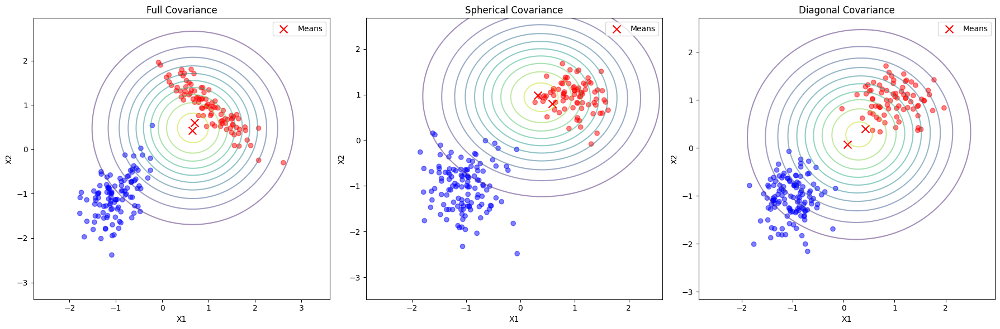

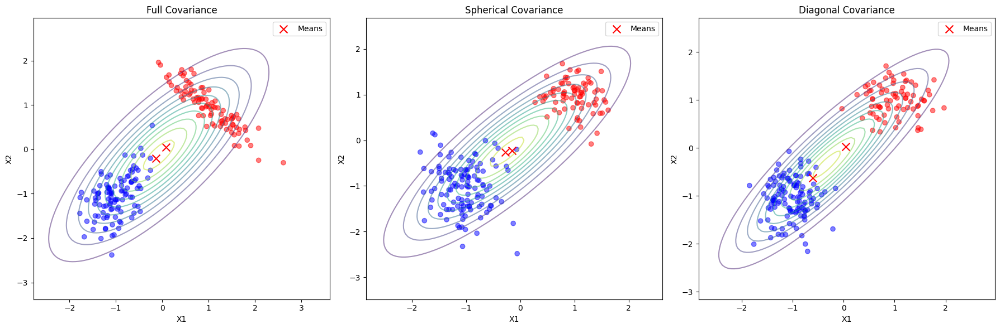

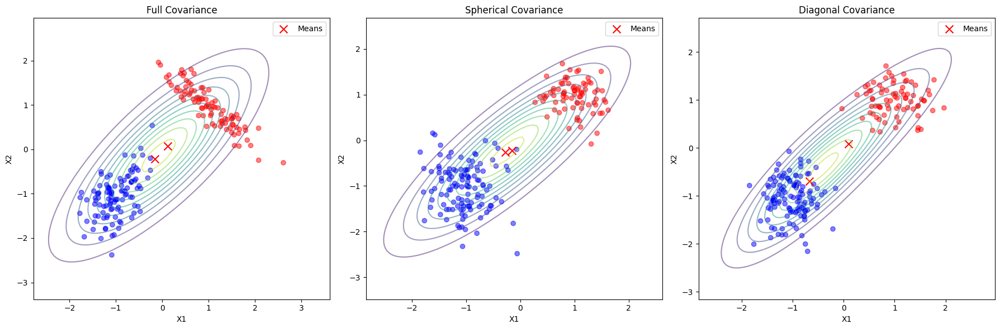

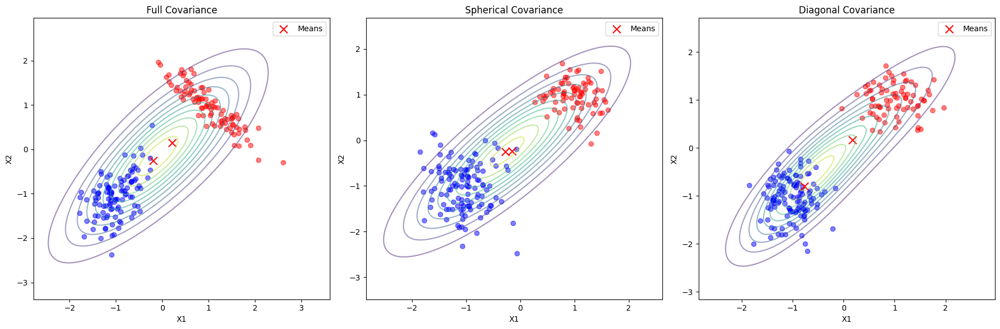

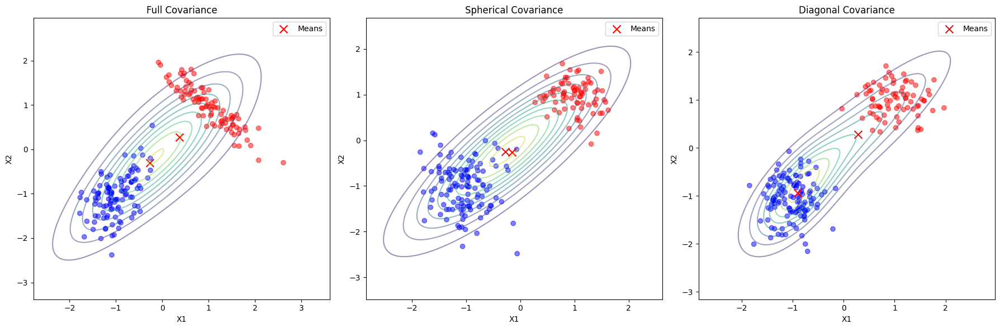

...

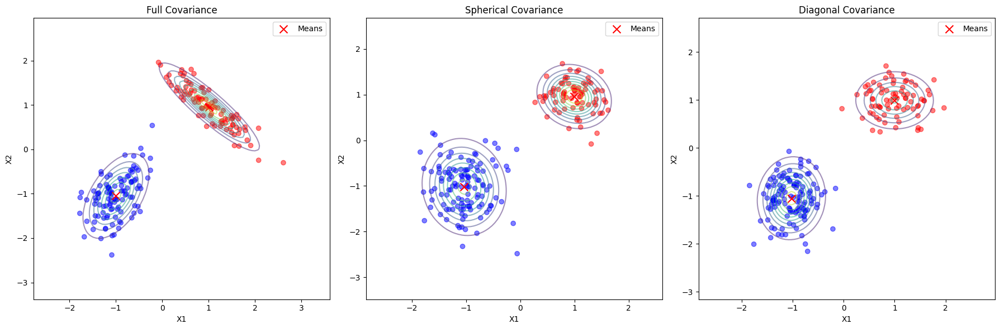

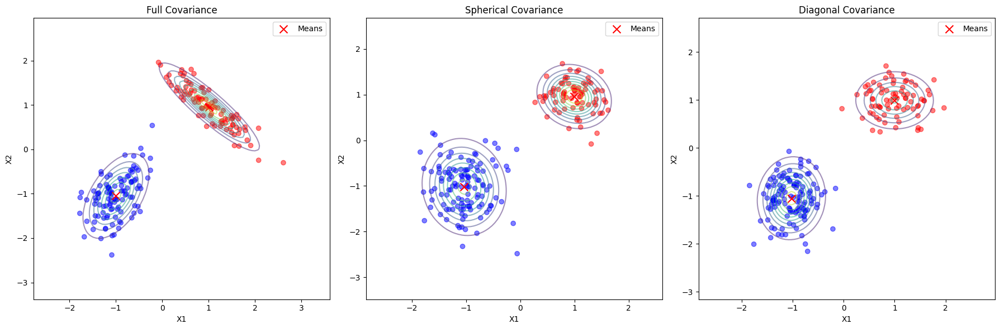

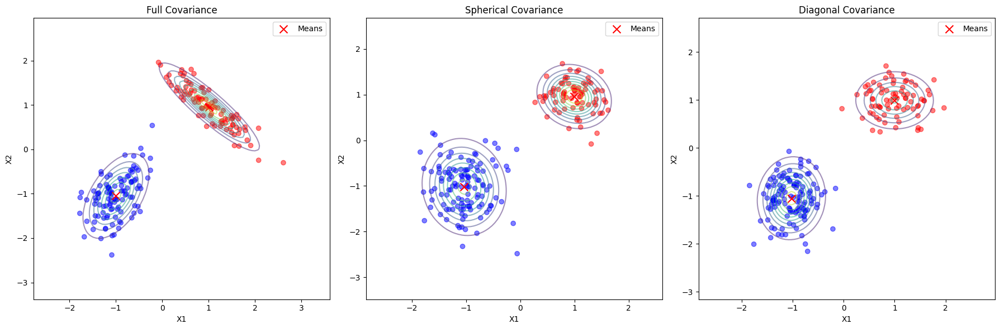

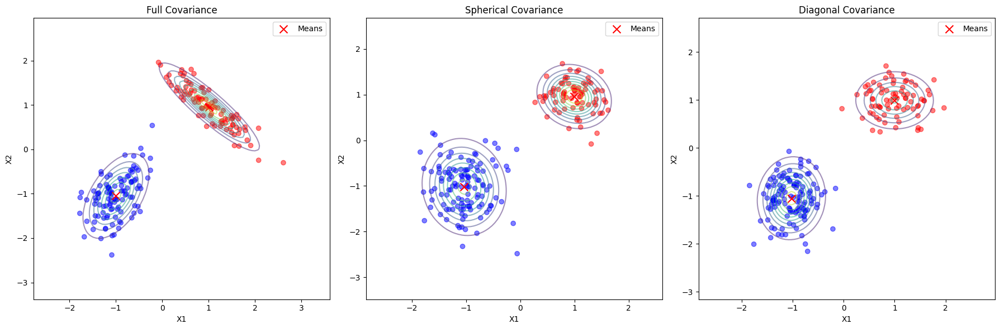

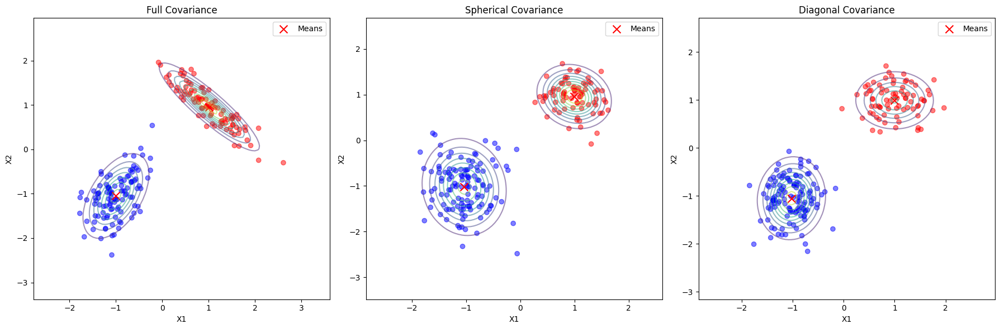

In [55]:
#All imports
import numpy as np
import pandas as pd
import random as rand
import matplotlib.pyplot as plt
from scipy.stats import norm, multivariate_normal
import sys
import math

##########################################
#Part-6)-b: Implimentation of Expectation-Maximization (EM) algorithm
##########################################

############################################################################
#Write a function to compute the log-likelihood of the data given the parameters
############################################################################
def likelihood(data, pi, mu, sigma, log_likelihood=False):
  #Inputs: data, parameters of GMM model
  #Outputs: likelihood

  log_likelihood = 0.0
  # print(sigma.shape)
  for n in range(data.shape[0]):
    #Iterate through the data points
    likelihood_n = 0.0
    for k in range(len(pi)):
      #Iterate through the components in GMM
      likelihood_n += pi[k] * multivariate_normal.pdf(data[n], mean=mu[k], cov=sigma[k])
      # print("")
      # print("Likelihood_n: ", likelihood_n)

    log_likelihood +=  np.log(likelihood_n)
  #Compute the log-likelihood
    # print("Pi: ", pi)
    # print("Likelihood: ", likelihood)

  return log_likelihood if log_likelihood else likelihood




############################################################################
#Write a function for the expectation step
############################################################################
def expectation(data, pi, mu, sigma):
  #Inputs: data, parameters of GMM model
  #Outputs: gamma: responsiblity of the kth gaussian in generating the nth data point
  gamma = np.zeros((data.shape[0], len(pi)))  #Initialize the gamma matrix
  for n in range(len(data)):
    #Iterate through the data points
    for k in range(len(pi)):
      #Iterate through the components in GMM
      numerator = pi[k] * multivariate_normal.pdf(data[n], mean=mu[k], cov=sigma[k])
      denominator = np.sum(np.array([pi[j] * multivariate_normal.pdf(data[n], mean=mu[j], cov=sigma[j]) for j in range(len(pi))]))
      gamma[n,k] = numerator/denominator
  return gamma


############################################################################
#Write a function for the maximization step.
############################################################################
def maximization(data, gamma):
  #Inputs: data, gamma
  #Outputs: Updated parameters of GMM model
  N = np.sum(gamma, axis=0)  # effective number of points generated by each component
  M = len(N)  # number of components
  pi = N / np.sum(N)  # update the prior probabilities
  mu  = np.array([np.sum(gamma[:, k].reshape(-1, 1) * data, axis=0) / N[k] for k in range(M)])  # update the mean vectors
  sigma = np.array([
      np.sum(
          gamma[:, k].reshape(-1, 1, 1) *
          np.einsum('ij,ik->ijk', (data - mu[k]), (data - mu[k])),
          axis=0
      ) / N[k]
      for k in range(M)
  ])
  # print(sigma.shape)

  #Return the parameters of GMM model
  return pi, mu, sigma



# Modify the plot_contours function to handle subplots
def plot_contours(data, labels, pi, mu, sigma, title, ax):
    # Inputs: data, labels, parameters of GMM model, title, and subplot axis
    x_min, x_max = data[:, 0].min() - 1, data[:, 0].max() + 1
    y_min, y_max = data[:, 1].min() - 1, data[:, 1].max() + 1
    x1, x2 = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    grid_points = np.c_[x1.ravel(), x2.ravel()]
    z = np.zeros((grid_points.shape[0], len(pi)))
    for k in range(len(pi)):
        z[:, k] = pi[k] * multivariate_normal.pdf(grid_points, mean=mu[k], cov=sigma[k])
    z = np.sum(z, axis=1)
    z = z.reshape(x1.shape)
    ax.contour(x1, x2, z, levels=10, cmap='viridis', alpha=0.5)  # plot the contours
    ax.scatter(data[:, 0], data[:, 1], c=labels, cmap='bwr', alpha=0.5)  # plot the data points
    ax.scatter(mu[:, 0], mu[:, 1], c='red', marker='x', s=100, label='Means')
    ax.set_title(title)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xlabel('X1')
    ax.set_ylabel('X2')
    ax.legend()

def random_psd_matrix(D):
    A = np.random.rand(D, D)  # Generate a random matrix
    psd_matrix = np.dot(A, A.T)  # Make it symmetric and positive semidefinite
    return psd_matrix

############################################################################
#Run the expectation and maximzation algorithm to estimate the parameters
############################################################################
N = 200

# Modify the EM algorithm loop to include three plots per iteration
nsteps = 30  # Number of steps to run EM algorithm
M = 2
D = 2
data_full, labels_full = generateData(pi_data, mu1, mu2, sig1, sig2, N)
data_sph, labels_sph = generateData(pi_data, mu1, mu2, sig1_s, sig2_s, N)
data_diag, labels_diag = generateData(pi_data, mu1, mu2, sig1_d, sig2_d, N)


pi_full = rng.random(M)      #Initialize the prior probabilities
pi_full = pi_full / np.sum(pi_full)
pi_diag = rng.random(M)      #Initialize the prior probabilities
pi_diag = pi_diag / np.sum(pi_diag)
pi_sph = rng.random(M)      #Initialize the prior probabilities
pi_sph = pi_sph / np.sum(pi_sph)

mu_full = rng.random((M, D))      #Initialize the mean vectors
mu_diag = rng.random((M, D))      #Initialize the mean vectors
mu_sph = rng.random((M, D))      #Initialize the mean vectors

sigma_full = np.array([[[1, 0], [0, 1]] for k in range(M)])   #Initialize the covariance matrices
sigma_diag = np.array([[[1, 0], [0, 1]] for k in range(M)])   #Initialize the covariance matrices
sigma_sph = np.array([[[1, 0], [0, 1]] for k in range(M)])   #Initialize the covariance matrices
# print(sigma.shape)
#Normalize the prior probabilities

for index in range(0, nsteps, 1):
    # Compute the likelihood
    ll_full = likelihood(data_full, pi_full, mu_full, sigma_full, log_likelihood=True)
    ll_diag = likelihood(data_diag, pi_diag, mu_diag, sigma_diag, log_likelihood=True)
    ll_sph = likelihood(data_sph, pi_sph, mu_sph, sigma_sph, log_likelihood=True)

    # Create a figure with three subplots for the covariance types
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Full covariance matrix
    plot_contours(data_full, labels_full, pi_full, mu_full, sigma_full, "Full Covariance", axes[0])

    # Spherical covariance matrix
    # diag_sigma = np.array([np.diag(np.diag(s)) for s in sigma])
    plot_contours(data_sph, labels_sph, pi_sph, mu_sph, sigma_sph, "Spherical Covariance", axes[1])

    # Diagonal covariance matrix
    # spherical_sigma = np.array([np.eye(s.shape[0]) * np.mean(np.diag(s)) for s in sigma])
    plot_contours(data_diag, labels_diag, pi_diag, mu_diag, sigma_diag, "Diagonal Covariance", axes[2])

    # Show the plots
    plt.tight_layout()
    plt.show()

    # Expectation step
    gamma_full = expectation(data_full, pi_full, mu_full, sigma_full)
    gamma_diag = expectation(data_diag, pi_diag, mu_diag, sigma_diag)
    gamma_sph = expectation(data_sph, pi_sph, mu_sph, sigma_sph)

    # Maximization step
    pi_full, mu_full, sigma_full = maximization(data_full, gamma_full)
    pi_diag, mu_diag, sigma_diag = maximization(data_diag, gamma_diag)
    pi_sph, mu_sph, sigma_sph = maximization(data_sph, gamma_sph)







In [56]:
rng.random(2)
rng.random((3,2))

array([[0.53347941, 0.05574689],
       [0.03134558, 0.59870622],
       [0.26061317, 0.91132207]])

<b> Report your observations </b>

1. The EM algorithm converges steadily, but its performance is highly sensitive to the initialization of parameters, as shown by variations in the log‐likelihood and decision contours across iterations.

2. The contour plots reveal clear differences between covariance types—full covariance models capture data correlations more accurately, while spherical and diagonal assumptions tend to oversimplify, affecting fit quality.

3. Visualizations also demonstrate that the choice of covariance structure significantly influences the resulting decision regions, emphasizing a trade-off between model complexity and stability in parameter estimation.
siz

